# pull_plot_vels.ipynb
Modification of `dataintegration-2.ipynb` from the IceSAT-2 2022 hackweek: https://icesat-2.hackweek.io/tutorials/DataIntegration/dataintegration-2.html

Modifications begun Nov 25, 2022, by Tim Bartholomaus.  Here comes AGU!

Pull down and plot velocity time series from the NSIDC.  This script requires running within the `greenlandMapping` environment, plus the addition of the `eofs` package/module.  The construction and setup of the `greenlandMapping` environment is described here: https://github.com/fastice/GrIMPNotebooks

# Data integration with ICESat-2 - Part II

__Credits__
* Zach Fair
* Ian Joughin
* Tasha Snow

```{admonition} Learning Objectives
**Goals**
- Access NSIDC data sets and acquire IS-2 using icepyx
- Analyze point and raster data together with IS-2
- Advanced visualizations of multiple datasets
```

For this tutorial, feel free to run the code along with us as we live code by downsizing the zoom window and splitting your screen (or using two screens). Or you can simply watch the zoom walkthrough. Don't worry if you fall behind on the code. The notebook is standalone and you can easily run the code at your own pace another time to catch anything you missed.

## Python environment

### GrIMP libraries

This notebook makes use of two packages for working with data from the Greenland Ice Mapping Project (GrIMP) that are stored remotely at NSIDC. These packages are:
- [grimpfunc](https://github.com/fastice/grimpfunc): Code for searching NISDC catalog for GrIMP data, subsetting the data, and working with flowlines.
- [nisardev](https://github.com/fastice/nisardev): Classes for working with velocity and image data.

In [ ]:
# from importlib import reload
# reload(eofs)
# import sys
# sys.modules.clear()

In [ ]:
# import sys
# sys.modules.keys()
# del(sys.modules['eofs.xarray'])

In [3]:
# import sys
# sys.modules.clear()
import numpy as np
import nisardev as nisar
import os
import matplotlib.colors as mcolors
import grimpfunc as grimp
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from datetime import datetime
import numpy as np
import xarray as xr
import importlib
import requests
import pyproj
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import panel
from dask.diagnostics import ProgressBar
import h5py
import random

import ipyleaflet
from ipyleaflet import Map,GeoData,LegendControl,LayersControl,Rectangle,basemaps,basemap_to_tiles,TileLayer,SplitMapControl,Polygon,Polyline

import ipywidgets
import datetime
import re

ProgressBar().register()
panel.extension()

from eofs.xarray import Eof

In [4]:
myProduct = nisar.nisarVelSeries()

temptemp = myProduct.readFromNetCDF('../All_Upe_TSX.nc')


In [5]:
temptemp

Sometimes the above cell will return an error about a missing module. If this happens, try restarting the kernel and re-running the above cells.

## NSIDC Login

For remote access to the velocity data at NSIDC, run these cells to login with your NASA EarthData Login (see  [NSIDCLoginNotebook](https://github.com/fastice/GRiMPNotebooks/blob/master/NSIDCLoginNotebook.ipynb) for further details). These cells can skipped if all data are being accessed locally. First define where the cookie files need for login are saved. 

These environment variables are used by GDAL for remote data access via [vsicurl](https://gdal.org/user/virtual_file_systems.html).

In [6]:
env = dict(GDAL_HTTP_COOKIEFILE=os.path.expanduser('~/.grimp_download_cookiejar.txt'),
            GDAL_HTTP_COOKIEJAR=os.path.expanduser('~/.grimp_download_cookiejar.txt'))
os.environ.update(env)

Now enter credentials, which will create the cookie files above as well as *.netrc* file with the credentials.

In [7]:
#!rm ~/.netrc
myLogin = grimp.NASALogin()
myLogin.view()

Getting login from ~/.netrc
Already logged in. Proceed.


## Load glacier termini
In this section we will read shapefiles stored remotely at NSIDC. 

The first step is to get the *urls* for the files in the NSDIC catalog.

In [ ]:
myTerminusUrls = grimp.cmrUrls(mode='terminus')  # mode image restricts search to the image products
myTerminusUrls.initialSearch();

Using the ```myTerminusUrls.getURLS()``` method to return the urls for the shape files, read in termini and store in a dict, `myTermini`, by year.

In [ ]:
myTermini = {}
for url in myTerminusUrls.getURLS():
    year = os.path.basename(url).split('_')[1]  # Extract year from name
    myTermini[year] = gpd.read_file(f'/vsicurl/&url={url}')  # Add terminus to data frame
    print(f'/vsicurl/&url={url}')

In [ ]:
myTermini['2000'].plot()

In [ ]:
for year in myTermini:
    myTermini[year] = myTermini[year].to_crs('EPSG:4326') # to lat/lon
myTermini['2000'].plot()  

## Flowlines
In this section we will work with a two collections of flowlines from [Felikson et al., 2020](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112). The full set of flowines for all of Greenland can be downloaded from [Zenodo](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112).  

The data are stored in the subdirectory *shpfiles* and can be read as follows:

In [ ]:
glaciers = {}
for i in range(1, 3):
    glaciers[f'000{i}'] = gpd.read_file(f'GrIMPNotebooks/shpfiles/glacier000{i}.shp').to_crs('EPSG:4326');

Note this is the same procedure as for the termini, except we are using a filename instead of a url.

## ICESat-2 ATL06

Now that we have the flowlines and termini, we are going to plot these alongside the ICESat-2 and ATM tracks. Remember the data we worked with yesterday? Here we are going to use that again for this mappinp project.

In [ ]:
# Load the ICESat-2 data
is2_file = 'processed_ATL06_20190420093051_03380303_005_01_full.h5'
with h5py.File(is2_file, 'r') as f:
    is2_gt2r = pd.DataFrame(data={'lat': f['gt2r/land_ice_segments/latitude'][:],
                                  'lon': f['gt2r/land_ice_segments/longitude'][:],
                                  'elev': f['gt2r/land_ice_segments/h_li'][:]}) # Central weak beam
    is2_gt2l = pd.DataFrame(data={'lat': f['gt2l/land_ice_segments/latitude'][:],
                                  'lon': f['gt2l/land_ice_segments/longitude'][:],
                                  'elev': f['gt2l/land_ice_segments/h_li'][:]}) # Central strong beam
    
# Load the ATM data
atm_file = 'ILATM2_20190506_151600_smooth_nadir3seg_50pt.csv'
atm_l2 = pd.read_csv(atm_file)

# Look only at the nadir track
atm_l2 = atm_l2[atm_l2['Track_Identifier']==0]

# Change the longitudes to be consistent with ICESat-2
atm_l2['Longitude(deg)'] -= 360

Next the data are subsetted to the range of ATM latitudes.

In [ ]:
# Subset the ICESat-2 data to the ATM latitudes
is2_gt2r = is2_gt2r[(is2_gt2r['lat']<atm_l2['Latitude(deg)'].max()) & (is2_gt2r['lat']>atm_l2['Latitude(deg)'].min())]
is2_gt2l = is2_gt2l[(is2_gt2l['lat']<atm_l2['Latitude(deg)'].max()) & (is2_gt2l['lat']>atm_l2['Latitude(deg)'].min())]

## Plot lidar tracks, flowlines and termini
Checking everything looks good before analysis by plotting the data over imagery rendered via ipyleaflet.

In [ ]:
center = [69.2, -50]
zoom = 8

mapdt1 = '2019-05-06'

m = Map(basemap=basemap_to_tiles(basemaps.NASAGIBS.ModisAquaTrueColorCR, mapdt1),center=center,zoom=zoom)

# gt2r_line = Polyline(
#     locations=[
#         [is2_gt2r['lat'].min(), is2_gt2r['lon'].max()],
#         [is2_gt2r['lat'].max(), is2_gt2r['lon'].min()]
#     ],
#     color="green" ,
#     fill=False
# )
# m.add_layer(gt2r_line)

# gt2l_line = Polyline(
#     locations=[
#         [is2_gt2l['lat'].min(), is2_gt2l['lon'].max()],
#         [is2_gt2l['lat'].max(), is2_gt2l['lon'].min()]
#     ],
#     color="green" ,
#     fill=False
# )
# m.add_layer(gt2l_line)

# atm_line = Polyline(
#     locations=[
#         [atm_l2['Latitude(deg)'].min(), atm_l2['Longitude(deg)'].max()],
#         [atm_l2['Latitude(deg)'].max(), atm_l2['Longitude(deg)'].min()]
#     ],
#     color="orange" ,
#     fill=False
# )
# m.add_layer(atm_line)
legend = LegendControl({'ICESat-2':'green','ATM':'orange'}, name = 'Lidar', position="topleft")
m.add_control(legend)

tLegend = {}
for i in range(3, 5):
    for key in myTermini:
        # Create list of lat/lon pairs
        r = lambda: random.randint(0,255)
        cr = '#%02X%02X%02X' % (r(),r(),r())
        term_coords = [[[xy[1],xy[0]] for xy in geom.coords] for geom in myTermini[key].loc[myTermini[key]['Glacier_ID'] == i].geometry]
        term_data = Polyline(locations=term_coords, weight=2, color=cr, fill=False)
        m.add_layer(term_data)
        tLegend[key] = cr
legend = LegendControl(tLegend, name="Terminus", position="topright")
m.add_control(legend)

for glacier in glaciers:
    gl_data = GeoData(geo_dataframe = glaciers[glacier],
                   style={'color': 'black', 'weight':1.0},
                   name = f'{glacier}')
    m.add_layer(gl_data)
    
m.add_control(LayersControl())

m

## Plot Flowines Using Remote Greenland Ice Mapping Project Data

ICESat measures thinning and thickening, which often is driven by changes in the flow of the glacier. 

Thus, to understand whether elevation change is driven by ice dynamics or changes in surface mass balance (net melting and snowfall), we need to look at how the flow velocity is evolving with time.

This section demonstrates how Greenland Ice Mapping Project (GrIMP) [data](https://nsidc.org/data/measures/grimp) can be remotely accessed. As an example, will  used flowlines from [Felikson et al., 2020](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112) distributed via [Zenodo](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112).  

Here we will use:
- ```grimp.Flowlines``` to read, manipulate, and store the flowlines data;
- ```grimp.cmrUrls``` to search the NISDC catalog; and
- ```nisar.nisarVelSeries``` to build a time-dependent stack of velocity data, which be plotted, interpolated etc.

### Read Shapefiles

In the examples presented here we will use glaciers 1 & 2  in the Felikson data base, [Felikson et al., 2020](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112), which were retrieved from [Zenodo](https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2020GL090112). 

Each glacier's flowlines are used to create `grimp.Flowlines` instances, which are saved in a dictionary, `myFlowlines` with glacier id: '0001' and  '0002'. 

Each `Flowlines` read a set of flowlines for each glacier and stores in a dictionary of `myFlowlines.flowlines`. The code to do this looks something like:

```
    flowlines = {}
    shapeTable = gpd.read_file(shapefile)
    for index, row in shapeTable.iterrows():  # loop over features
        fl = {}  # New Flowline
        fl['x'], fl['y'] = np.array([c for c in row['geometry'].coords]).transpose()
        fl['d'] = computeDistance(fl['x'], fl['y'])
        flowlines[row['flowline']] = fl
 ```
For further detail, see the full [class definition](https://github.com/fastice/grimpfunc/blob/master/grimpfunc/Flowlines.py)

To limit the plots to the downstream regions, the flowlines are all truncated to a `length` of 50km. 

Within each myFlowines entry (a `grimp.Flowlines` instance), the individual flowlines are maintained as a dictionary `myFlowlines['glacierId'].flowlines`.

In [ ]:
myShapeFiles = [f'./GrIMPNotebooks/shpfiles/glacier000{i}.shp' for i in range(1, 3)] # Build list of shape file names
myFlowlines = {x[-8:-4]: grimp.Flowlines(shapefile=x, name=x[-8:-4], length=50e3) for x in myShapeFiles} 
myFlowlines

Each flowline is indexed as shown here:

In [ ]:
myFlowlines['0001'].flowlines.keys()

The data for the flow line is simple, just `x`, `y` polar stereographic coordinates (EPSG=3413) and the distance, `d`, from the start of the flowline.

In [ ]:
myFlowlines['0001'].flowlines['03'].keys()

These coordinates for a given index can be returned as `myFlowlines['0001'].xym(index='03')` or `myFlowlines['0001'].xykm(index='03')` depending on whether m or km are preferred.

<a id='bounds'></a>The area of interest can be defined as the union of the bounds for all of the flowlines computed as shown below along with the unique set of flowline IDs across all glaciers. We will use the bounding box [below](#subsettext) to subset the data.

In [ ]:
myBounds = {'minx': 1e9, 'miny': 1e9, 'maxx': -1e9, 'maxy': -1e9}  # Initial bounds to force reset
flowlineIDs = []  # 
for myKey in myFlowlines:
    # Get bounding box for flowlines
    flowlineBounds = myFlowlines[myKey].bounds
    # Merge with prior bounds
    myBounds = myFlowlines[myKey].mergeBounds(myBounds, flowlineBounds)
    # Get the flowline ids
    flowlineIDs.append(myFlowlines[myKey].flowlineIDs())
# Get the unique list of flowlines ids (used for legends later)
flowlineIDs = np.unique(flowlineIDs)
print(myBounds)
print(flowlineIDs)

In [ ]:
myBounds = {'minx': -320000, 'miny': -1870000, 'maxx': -275000, 'maxy': -1810000}  # Initial bounds to force reset


## Search Catalog for Velocity Data

We now need to locate velocity data from the GrIMP data set. For this exercise, we will focus on the annual velocity maps of Greenland. To do this, we will use the [grimp.cmrUrls](https://github.com/fastice/grimpfunc/blob/master/grimpfunc/cmrUrls.py) tool, which will do a GUI based search of NASA's Common Metadata Repository ([CMR](https://earthdata.nasa.gov/eosdis/science-system-description/eosdis-components/cmr)). Search parameters can be passed directly to `initialSearch` method to perform the search.

In [8]:
myUrls = grimp.cmrUrls(mode='subsetter', verbose=True)  # nisar mode excludes image and tsx products and allows only one product type at a time
# myUrls.initialSearch(product='NSIDC-0725')
myUrls.initialSearch(product='NSIDC-0481')

https://cmr.earthdata.nasa.gov/search/granules.json?provider=NSIDC_ECS&sort_key[]=start_date&sort_key[]=producer_granule_id&scroll=false&page_size=2000&page_num=1&short_name=NSIDC-0481&version=3&temporal[]=2000-01-01T00:00:01Z,2022-12-12T00:23:59&bounding_box[]=-75.00,60.00,-5.00,82.00&producer_granule_id[]=*E61.10N*&options[producer_granule_id][pattern]=true
https://cmr.earthdata.nasa.gov/search/granules.json?provider=NSIDC_ECS&sort_key[]=start_date&sort_key[]=producer_granule_id&scroll=false&page_size=2000&page_num=1&short_name=NSIDC-0481&version=4&temporal[]=2000-01-01T00:00:01Z,2022-12-12T00:23:59&bounding_box[]=-75.00,60.00,-5.00,82.00&producer_granule_id[]=*E61.10N*&options[producer_granule_id][pattern]=true


Row
    [0] Column(min_width=700)
        [0] Markdown(str)
        [1] Param(cmrUrls, name='Select Product &..., widgets={'product': <class 'panel....}, width=700)
        [2] Row
            [0] Markdown(str)
            [1] Markdown(str)
    [1] Column
        [0] ParamMethod(method)
        [1] ParamMethod(method)
        [2] ParamMethod(method)

The `verbose` flag causes the CMR search string to be printed. The search basically works by a) reading the parameters from the search panel (e.g., product, date, etc) and creating a search string, which returns the search result.

In [ ]:
# # For some environments the tool is unresponsive (i.e., search button doesn't work) - this can often be fixed by re-running this cell
# myUrls = grimp.cmrUrls(mode='nisar')  # Subsetter mode is required for subsetting.
# display(myUrls.initialSearch())
myCogs = myUrls.getCogs(replace='vv', removeTiff=True)
baseNames = [x.split('/')[-1] for x in myCogs]
print(baseNames[:6])

In [ ]:
# # This cell seems to be a dead end -Tim
# response = requests.get('https://cmr.earthdata.nasa.gov/search/granules.json?provider=NSIDC_ECS&sort_key[]=start_date&sort_key[]='
#                         'producer_granule_id&scroll=false&page_size=2000&page_num=1&short_name=NSIDC-0725&version=3&temporal[]='
#                         '2000-01-01T00:00:01Z,2022-03-10T00:23:59&bounding_box[]=-75.00,60.00,-5.00,82.00&producer_granule_id[]='
#                         '*&options[producer_granule_id][pattern]=true')
# search_results = response.json()
# search_results;

Under the hood, the `cmrUrls` code can filter the json to get a list of urls:

In [ ]:
myUrls.getURLS()

### Load the Velocity Data

GrIMP produces full Greenland velocity maps. Collectively, there are more than 400 full Greenland maps, totalling several hundred GB of data, which may be more than a user interested in a few glaciers wants to download and store on their laptop.  Fortunately using Cloud Optimized Geotiffs only the data are actually needed are downloaded. As a quick review, COGs have the following properties:

- All the metadata is at the beginning of the file, allowing a single read to obtain the layout. 
- The data are tiled (i.e., stored as a series of blocks like a checkerboard) rather than as a line-by-line raster.  
- A consistent set of overview images (pyramids) are stored with the data.

While the velocity data are stored as multiple files at NSIDC, they can all be combined into a single [nisarVelSeries](https://github.com/fastice/nisardev/blob/main/nisardev/nisarVelSeries.py) instance, which has the following properties:

- Built on Xarray,
- Dask (parallel operations),
- Local and remote subsetting (Lazy Opens), and
- Subsets can be saved for later use

Before loading the data, we must setup the filename template for the multi-band velocity products. 

Specifically, we must put a '\*' where the band identifier would go and remove the trailing '.tif' extension. 

In [9]:
urlNames = [x.replace('vv','*').replace('.tif','') for x in myUrls.getCogs()] # getCogs filters to ensure tif products
urlNames[0:5]

['https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2009.02.05/TSX_W72.90N_05Feb09_16Feb09_20-33-30_vx_v04.0',
 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2009.04.23/TSX_W72.90N_23Apr09_04May09_20-33-32_vx_v04.0',
 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2009.07.09/TSX_W72.90N_09Jul09_20Jul09_20-33-35_vx_v04.0',
 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2009.09.02/TSX_W72.90N_02Sep09_13Sep09_20-33-38_vx_v04.0',
 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2009.11.07/TSX_W72.90N_07Nov09_18Nov09_20-33-40_vx_v04.0']

We can now create a `nisarVelocitySeries` object, which will create a large time series stack with all of the data.

In [10]:
myVelSeries = nisar.nisarVelSeries() # Create Series
myVelSeries.readSeriesFromTiff(urlNames, url=True, readSpeed=False)  # readSpeed=False computes speed from vx, vy rather than downloading
myVelSeries.xr  # Add semicolon after to suppress output

<xarray.DataArray 'VelocitySeries' (time: 120, band: 3, y: 652, x: 546)>
dask.array<concatenate, shape=(120, 3, 652, 546), dtype=float32, chunksize=(1, 1, 652, 546), chunktype=numpy.ndarray>
Coordinates: (12/18)
    _FillValue      float64 -1.0
  * time            (time) datetime64[ns] 2009-02-10T12:00:00 ... 2022-09-11T...
    id              (time) <U115 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES...
  * band            (band) <U2 'vx' 'vy' 'vv'
  * x               (x) float64 -3.246e+05 -3.245e+05 ... -2.702e+05 -2.701e+05
  * y               (y) float64 -1.808e+06 -1.808e+06 ... -1.873e+06 -1.873e+06
    ...              ...
    raster:bands    object {'data_type': 'float32', 'scale': 1.0, 'offset': 0...
    epsg            int64 3413
    name            <U4 'temp'
    spatial_ref     int64 0
    time1           (time) datetime64[ns] 2009-02-05 2009-04-23 ... 2022-09-06
    time2           (time) datetime64[ns] 2009-02-16 2009-05-04 ... 2022-09-17

For the annual data set, this step produces a ~7GB data sets, which expands to 370GB for the full 6-12-day data set. 

<a id='subsettext'></a>To avoid downloading unnessary data, the data can be subsetted using the bounding box we created [above](#bounds) from the flowlines. 

In [ ]:
myVelSeries.subSetVel(myBounds) # Apply subset
myVelSeries.subset # Add semicolon after to suppress output

The volume of the data set is now a far more manageable ~15MB, which is still located in the archive.  

With dask, operations can continue without downloading, until the data are finally needed to do something (e.g., create a plot). 

If lots of operations are going to occur, however, it is best to download the data upfront. 

In [11]:
myVelSeries.loadRemote() # Load the data to memory

[########################################] | 100% Completed | 124.47 s


In [12]:
# myVelSeries.toNetCDF('../All_Upe_TSX_b.nc')  # Use lower number if crashes, bump up <15 to increase download speed.

'../All_Upe_TSX_b.nc'

### Overview Images

In the above, we picked out a small region for Greenland and downloaded a full-res data series. But in some cases, we may want the full image at reduced resolution (e.g., for an overview map). 

Here we can take advantage of the overviews to pull a single velocity map at reduced resolution (`overviewLevel=3`).

In [ ]:
urlNames[-1]

In [ ]:
myOverview = nisar.nisarVelSeries() # Create Series
myOverview.readSeriesFromTiff([urlNames[-1]], url=True, readSpeed=False)#, overviewLevel=3)  # readSpeed=False computes speed from vx, vy rather than downloading
myOverview.loadRemote()

In [ ]:
myOverview.xr  # Add semicolon after to suppress output

### Display Flowlines and Velocity

<a id='mapplot'></a>In the next cell, we put the above pieces together:
- Display speed with linear and log color bars,
- Use the overview image for an inset.
- Plot the flowline line locations.
- For a later [plot](#points), extract a point 10-km along each flowline using `myFlowlines[glacierId].extractPoints(10, None, units='km')`

In [ ]:
dir(myVelSeries)


In [ ]:
myVelSeries.xr
print(myVelSeries.xr[:,0,200,300].to_numpy())
print( np.nanmean(myVelSeries.xr[:,0,200,300].to_numpy()) )
print(velAnomaly.xr[:,0,200,300].to_numpy())

In [ ]:
# myVelSeries.sum('time')

# myVelSeries.mean()

type(myVelSeries)
myVelSeries.time



In [ ]:
fig, axes = plt.subplots(ncols=2, figsize=(12,5))
myVelSeries.mean().displayVelForDate(ax=axes[0], units='km')
myVelSeries.mean(skipna=False).displayVelForDate(ax=axes[1], units='km')
fig.tight_layout()

In [ ]:
# velAnomaly_fill_ni = nisar.nisarVelSeries()
# velAnomaly_fill_ni = nisar.nisarBase2D.readXR(velAnomaly_fill)
velAnomaly_fill_ni = nisar.nisarBase2D.initXR(XR=velAnomaly_fill)
velAnomaly_fill_ni

In [ ]:
velAnomaly_fill.time

In [ ]:
velAnomaly_fill.time[i]

In [ ]:
velAnomaly_fill.time.to_numpy()[3].astype(str)[:10]

In [14]:
# A key cell. Actually define the velAnomaly_fill xarray object
velAnomaly = myVelSeries.anomaly()

velAnomaly_fill = velAnomaly.xr.copy(deep=True)
velAnomaly_fill

velAnomaly_fill = velAnomaly_fill.fillna(0.0) # First fill missing values with 0s
# Then go back and find the places where no data whatsoever is known and replace these with nans
mean_anom = velAnomaly.xr.mean(dim='time', skipna=True)

# velAnomaly_fill[:,outside_bounds.isnull()] = np.nan

# mean_anom.isnull()

velAnomaly_fill = xr.where(mean_anom.isnull(), np.nan, velAnomaly_fill)
velAnomaly_fill = velAnomaly_fill.transpose('time', 'band', 'y', 'x')
# velAnomaly_fill



# plt.figure()
# outside_bounds[2,:,:].plot()
# plt.figure()
# velAnomaly_fill[3,2,:,:].plot()

### Plot the velocity fields

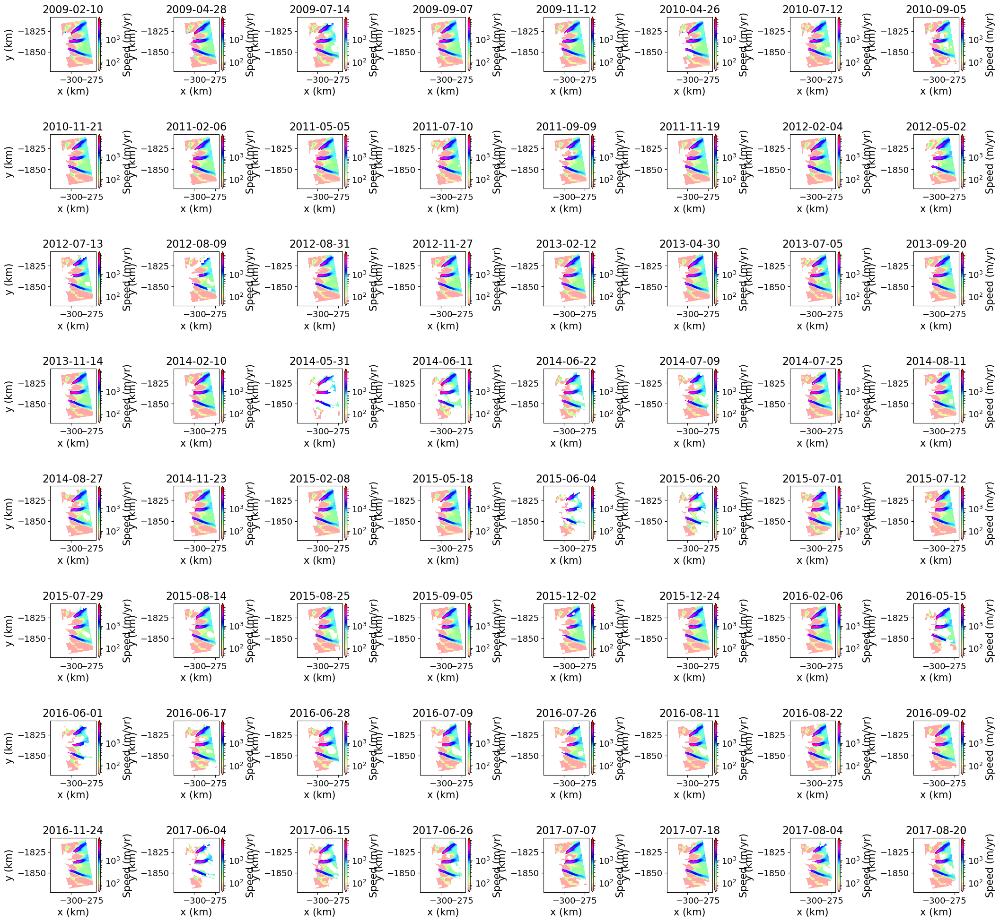

In [100]:
#Positive anomaly is faster than the mean.

myVelSeries.time
# dir(myVelSeries)
# fig, axes = plt.subplots(4, 8, figsize=(21, 12))
fig, axes = plt.subplots(8, 8, figsize=(21, 20))
# fig, axes = plt.subplots(3, 4, figsize=(21, 15))
for date, ax, i in zip(myVelSeries.time[0:], axes.flatten(), range(64)):
    # myVelSeries.displayVelForDate(date=date, band='vv', ax=ax, units='km', scale='linear')
    myVelSeries.displayVelForDate(date=date, band='vv', ax=ax, units='km', scale='log', vmin=50, vmax=8000)
    
    # velAnomaly.displayVelForDate(date=date, band='vv', ax=ax, units='km', vmin=-500, vmax=500, cmap='coolwarm', axisOff=True)

    # xr.plot.pcolormesh(velAnomaly_fill[i+1,2,:,:], ax=ax, vmin=-500, vmax=500, cmap='coolwarm', add_colorbar=False, add_labels=False)
    # ax.set_title(velAnomaly_fill.time.to_numpy()[i+1].astype(str)[:10]) #velAnomaly_fill.time[i+1])
fig.tight_layout()

# fig.savefig('TSX_vel_complete.png')

In [ ]:
units='km'
# %%time
#Compute Stats
velMean = myVelSeries.mean()
velSigma = myVelSeries.stdev()
velCount = myVelSeries.numberValid()

fig, axes = plt.subplots(1, 3, figsize=(18,6.5))
velMean.displayVelForDate(ax=axes[0], units=units, midDate=True, colorBarLabel='Mean Speed (m/yr)')
velSigma.displayVelForDate(ax=axes[1], date=None, units=units, midDate=True, vmin=0, vmax=1000, autoScale=False, colorBarLabel='Std Deviation of Speed (m/yr)')
velCount.displayVelForDate(ax=axes[2], date=None, units=units, midDate=True, vmin=0, vmax=120, autoScale=False, colorBarLabel='Number Valid', extend='neither')
fig.suptitle('Mean, Sigma, and Number of Valid Points', fontsize=16)
fig.tight_layout()

# plt.savefig('Basic_stats.png')

In [ ]:
myVelSeries.xr
print(myVelSeries.xr[:,0,200,300].to_numpy())
print(myVelSeries.xr[:,0,200,300].isnull().to_numpy())
print( np.nanmean(myVelSeries.xr[:,0,200,300].to_numpy()) )
print(velAnomaly.xr[:,0,200,300].to_numpy())

print(velAnomaly_fill[:,0,200,300].to_numpy())

In [ ]:
velAnomaly.xr.data.shape
velAnomaly.xr.dims
velAnomaly.xr.sel(band='vv')

### Point plots and profiles
A ```VelSeries``` object can directly plot the time series for a point or a profile for a single time as demonstrated in the next cell.

In [ ]:
# Generate a horizontal profile (fixed y) in units of km
# xprof = np.arange(200, 280, .25)
# yprof = np.full(xprof.shape, -1530)
yprof = np.arange(-1842, -1833, 0.25)
xprof = np.full(yprof.shape, -295)
xpt, ypt = -298, -1837 #250, -1530
#
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
#
# Display velocity and locations of point and profile
myVelSeries.displayVelForDate('2017-06-01', ax=axes[0], units='km', colorBarPosition='top', title='')
axes[0].plot(xprof, yprof, color='k')
axes[0].plot(xpt, ypt, '*r', markersize=12)
#
# plot time series for point
myVelSeries.plotPoint(xpt, ypt, 'r-*', ax=axes[1], markersize=12, units='km')
myVelSeries.labelPointPlot(ax=axes[1], title='Speed Near the Center of the Ice Stream')
# plot profile for each date
for date in myVelSeries.time:
    myVelSeries.plotProfile(xprof, yprof, date=date, ax=axes[2], units='km')
# label with all fontsizes increased by 30%
myVelSeries.labelProfilePlot(ax=axes[2], title='Profiles of Speed Across the Ice Stream', fontScale=1.3)
# axes[2].legend()
fig.tight_layout()
plt.savefig('Point_and_profile.png')

## EOFs
~~requires manual edits of xarray.py at ~/opt/anaconda3/envs/greenlandMapping/lib/python3.10/site-packages/eofs/xarray.py per https://github.com/ajdawson/eofs/issues/123
At lines 181 and 639~~

Be sure to build the `eofs` package from github master, rather than building from conda, which leans on a version of `eofs` that is over three years old and has multiple bugs.

In [ ]:
# type( velAnomaly.xr.sel(band='vv') )
type( velAnomaly_fill.sel(band='vv') )


### Solve for and plot the first several eigenmodes

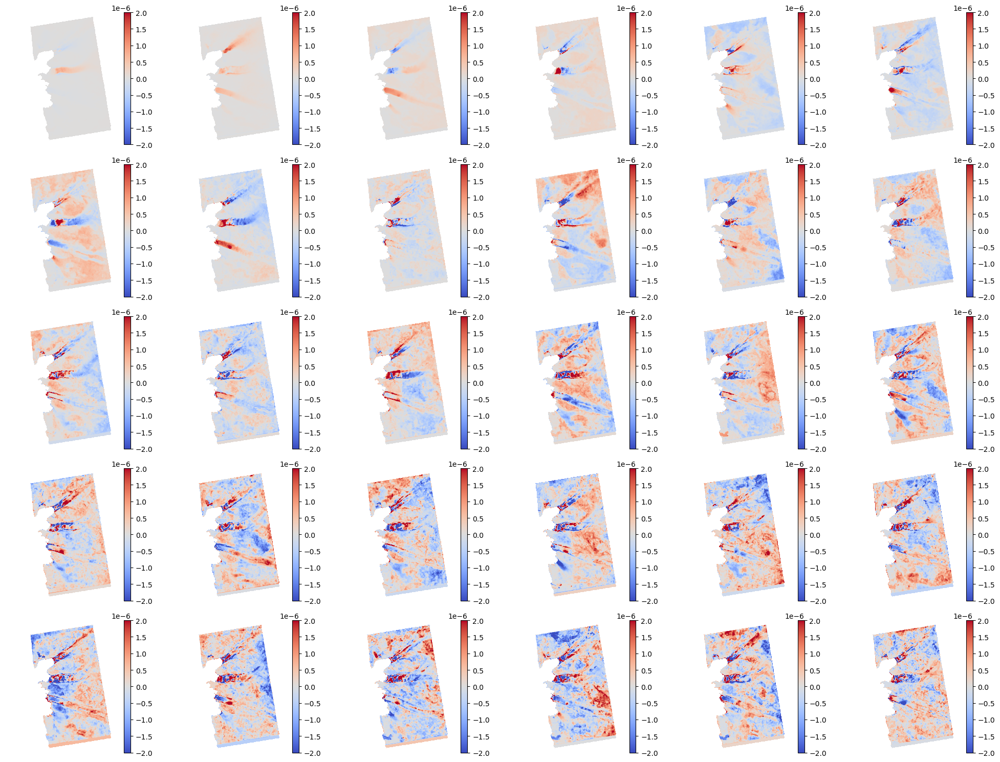

In [134]:

# solver = Eof(velAnomaly.xr.sel(band='vv'), center=True)
# solver = Eof(velAnomaly_fill.sel(band='vv'), center=True)
solver = Eof(velAnomaly_fill, center=True)

pc = solver.pcs(npcs=5, pcscaling=1) # Eigenvalues of the first N nodes
eof1 = solver.eofs(neofs=30, eofscaling=1)

# fig, axes = plt.subplots(ncols=eof1.shape[0], figsize=(25,5) )
fig, axes = plt.subplots(ncols=eof1.shape[0]//5, nrows=5, figsize=(20,15) )

for i, ax in zip( range(eof1.shape[0]), axes.flatten() ):
    img = ax.imshow(eof1[i].squeeze(), cmap='coolwarm', vmin=-2e-6, vmax=2e-6)
    plt.colorbar(img, ax=ax)
    ax.axis('off')

fig.tight_layout()
# plt.savefig('eofs_complete_censored_not_rebuilt.png')
# plt.savefig('eofs_complete_censored_yes_rebuilt.png')

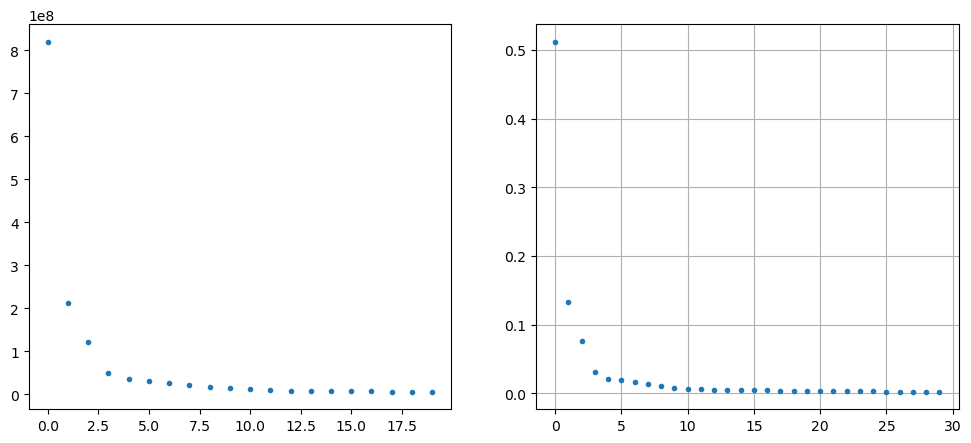

In [135]:
fig, axes = plt.subplots(ncols=2, figsize=(12,5))
axes[0].plot(solver.eigenvalues()[:20], '.')
axes[1].plot(solver.varianceFraction()[:30], '.')
# axes[1].set_ylim((0,0.1))
axes[1].grid()

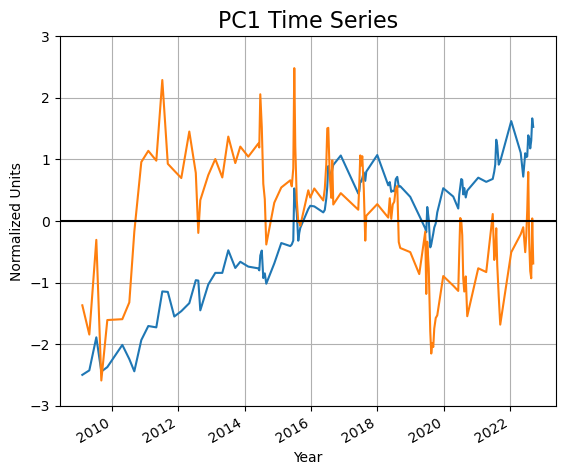

In [17]:
plt.figure()
pc[:, 0].plot()#color='b', linewidth=2)
pc[:, 1].plot()#color='b', linewidth=2)
ax = plt.gca()
ax.axhline(0, color='k')
ax.set_ylim(-3, 3)
ax.set_xlabel('Year')
ax.set_ylabel('Normalized Units')
ax.set_title('PC1 Time Series', fontsize=16)
ax.grid()

# plt.savefig('pc_complete_censored.png')

### Reconstruct velocity fields, based on mapped modes, and the strength (or principle component or eigenvalue) of each mode

In [18]:
# Run the EOF analysis only where we have measured anomalies in all of the 31 velocity maps
# # solver = Eof(anom_vol, center=True)

# Run the EOF analysis of the zero-filled anomalies
solver = Eof(velAnomaly_fill, center=True)

n_eofs_to_use = 4 # Number of "trusted" EOFs to use to fill values
reconstruction = solver.reconstructedField(n_eofs_to_use)

delta_field = reconstruction - velAnomaly_fill # How different is the reconstructed field from the zero-filled field?

i = 14 # Which measures velocity geotiff to look at, for testing/plotting



In [ ]:
reconstruction.shape
# len(reconstruction)

In [ ]:
np.datetime_as_string(reconstruction.time[i].to_numpy() , unit='D')

AttributeError: 'numpy.ndarray' object has no attribute 'imshow'

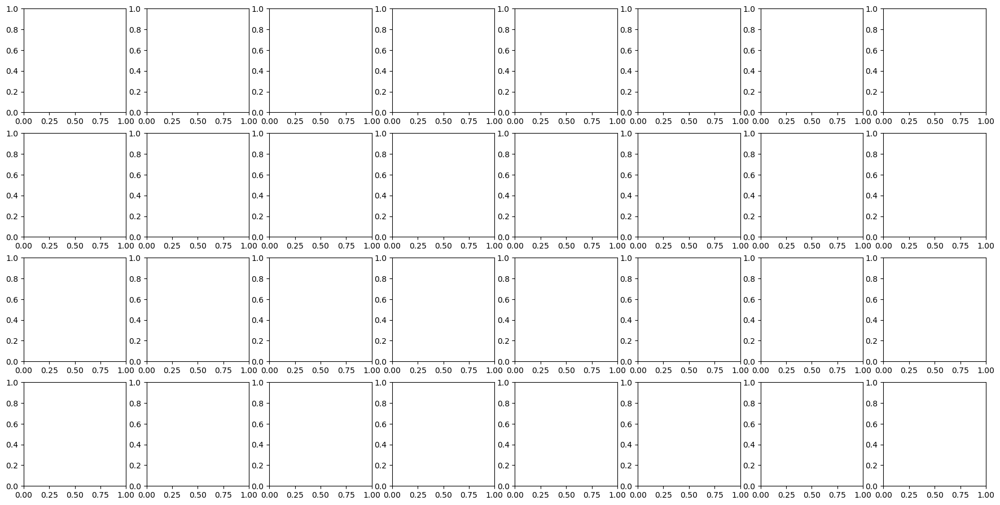

In [150]:
fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(22,11))
for ax, i in zip(axes, np.arange(48, 48+32)):#range(32):#len(reconstruction)):
    # col = i %  ax.shape[1]
    # row = i // ax.shape[1]
    # img = ax[row, col].imshow(reconstruction[i,2,:,:], 
    #                           cmap='coolwarm', vmin=-500, vmax=500)
    # # img = ax[row, col].imshow(delta_field[i,2,:,:], 
    # #                           cmap='coolwarm', vmin=-500, vmax=500)
    # ax[row, col].set_title( np.datetime_as_string(reconstruction.time[i].to_numpy() , unit='D') )#reconstruction.time[i])
    
    img = ax.imshow(velAnomaly_fill[i,:,:], 
                              cmap='coolwarm', vmin=-5000, vmax=5000)
    ax.set_title( np.datetime_as_string(velAnomaly_fill.time[i].to_numpy() , unit='D') )#reconstruction.time[i])

    ax.axis('off')

cax = plt.axes([.93, .03, .02, .84])
plt.colorbar(img, cax=cax)#ax[row, col])
# plt.savefig('vel_anomaly_reconstruction.png')

#### Key cell: converge on in-filled velocity anomalies, using EOFs

In [ ]:
delta_field
velAnomaly.xr.isnull()
print(velAnomaly_fill.shape)
print(velAnomaly.xr.shape)
velAnomaly.xr.isnull()
velAnomaly_fill[velAnomaly.xr.isnull().to_numpy()]

In [ ]:
da = xr.DataArray(np.arange(16).reshape(4, 4), dims=["x", "y"])
print(da.sel(x=1))
print(da.sel(y=1).where(da.y<4))
print(da)
da.where(da.x + da.y < 4)

In [ ]:
# Plot some figs

# This is the code necessary to return the reconstructed velocities only at the locations where no data originally existed
# xr.where(vel_is_null, reconstruction, np.nan)

vel_is_null = velAnomaly.xr.isnull()

# velAnomaly_fill[np.isnan(velAnomaly)]
i=40#95
fig, axes = plt.subplots(1,3, figsize=(15,5))
to_plot = velAnomaly_fill.where(velAnomaly.xr.isnull(), True , True)[i, 2, :,:]
# xr.plot.pcolormesh(to_plot, ax=axes[0])
# xr.plot.pcolormesh( xr.where(velAnomaly.xr.isnull(), reconstruction, np.nan)[i, 2, :,:], ax=axes[0])
xr.plot.pcolormesh( xr.where(vel_is_null, reconstruction, np.nan)[i, 2, :,:], ax=axes[0])
# xr.plot.pcolormesh( xr.where(velAnomaly.xr.isnull(), reconstruction, velAnomaly.xr)[i, 2, :,:], ax=axes[0])



# xr.plot.pcolormesh(velAnomaly.xr.isnull()[i,2,:,:], ax=axes[1])
xr.plot.pcolormesh(velAnomaly.xr[i,2,:,:], ax=axes[1])



# reconstruction[velAnomaly.xr.isnull()]
# xr.plot.pcolormesh(reconstruction.where(velAnomaly.xr.isnull())[i,2,:,:], ax=axes[2])
# xr.plot.pcolormesh(velAnomaly_fill.where(velAnomaly.xr.isnull(), reconstruction)[i,2,:,:], ax=axes[2])
xr.plot.pcolormesh(velAnomaly_fill.where(vel_is_null, reconstruction)[i,2,:,:], ax=axes[2])
# velAnomaly_fill.where(velAnomaly.xr.isnull(), reconstruction)

In [ ]:
print( delta_field.shape )
print( vel_is_null.shape )
print( delta_field.max().to_numpy() )
print( np.nanmax( delta_field.to_numpy() ) )
print( np.nanargmax( delta_field.to_numpy() ) )
print( np.unravel_index(np.nanargmax(delta_field.to_numpy(), axis=None), delta_field.to_numpy().shape) )
print( delta_field.to_numpy()[6,2, 194, 270] ) 

# print( delta_field.argmax(dim=['time', 'band', 'x', 'y']) )

print( delta_field[6,2, 194, 270] ) 

In [ ]:
arg_dict = delta_field.argmax(dim=['time', 'band', 'x', 'y'])
for key in arg_dict.keys():
    print(arg_dict[key].to_numpy())
# print( delta_field.argmax(dim=['time', 'band', 'x', 'y']) )


In [ ]:
np.nanargmax(delta_censored, axis=None)

In [ ]:
# A working slide used to identify the coordinates of the max or min values
delta_censored = delta_field.to_numpy()[vel_is_null.to_numpy()]
# print( type(delta_censored) )
print( delta_field.shape )
delta_censored_xr = xr.where(vel_is_null, delta_field, np.nan)

print( 'Delta_censored_max via np: ', np.nanmax( delta_field.to_numpy()[vel_is_null.to_numpy()] ) )
print( 'Delta_censored_max via xr: ', delta_censored_xr.max().to_numpy() )
# print( delta_field[13,0,375,540] )

print( '  indices via np.unravel_index of xr to np: ', np.unravel_index(np.nanargmax(delta_censored_xr.to_numpy(), axis=None), delta_field.to_numpy().shape, order='C') )
print( '  indices via np.unravel_index: ', np.unravel_index(np.nanargmax(delta_censored, axis=None), delta_field.to_numpy().shape, order='C') )
# print( np.unravel_index(np.nanargmax(delta_field.to_numpy()[vel_is_null.to_numpy()], axis=None), delta_field.to_numpy().shape) )

arg_dict =  delta_censored_xr.argmax(dim=['time', 'band', 'x', 'y']) 
for key in arg_dict.keys():
    print(arg_dict[key].to_numpy())
    
print( delta_field[21,2,196,198].to_numpy() )

print( '   ', abs(xr.where(vel_is_null, delta_field_i, np.nan)).mean().to_numpy() ,
                  xr.where(vel_is_null, delta_field[i,2,:,:], np.nan).max().to_numpy() )


In [ ]:
# # xr.where(vel_is_null, delta_field_i, np.nan)[:,2,:,:].max().to_numpy()
# print( xr.where(vel_is_null, delta_field_i, np.nan).max().to_numpy() )
# # print( xr.where(vel_is_null, delta_field_i, np.nan).argmax(dim=['time', 'band', 'x', 'y']) )
# dict =  xr.where(vel_is_null, delta_field_i, np.nan).argmax(dim=['time', 'band', 'x', 'y'])
# dict['time'].to_numpy()

# print( xr.where(vel_is_null, delta_field, np.nan)[:,:,:,:].max().to_numpy() )
# print( delta_field.max().to_numpy() )
# print( xr.where(vel_is_null, delta_field, np.nan).argmax(dim=['time', 'band', 'x', 'y']) )
# print( delta_field[21, 2, 238, 276].to_numpy() )
# print( delta_field.argmax(dim=['time', 'band', 'x', 'y']) )
# print( delta_field[21, 0, 226, 276].to_numpy() )

# print(delta_field.where(delta_field==delta_field.max(), drop=True).squeeze())
delta_field.where(delta_field==delta_field.max(), drop=True).squeeze()
# print(delta_field[1,2,1,1])

# delta_field_i[250,182]
# print( delta_field[7, 2, 250, 182].to_numpy() )
# #argmax delta_field 21, 2, 238, 276
# print(delta_field[21, :, 238, 276] )

# print( xr.where(vel_is_null, delta_field, np.nan)[21, 2, 238, 276] )
# print( xr.where(vel_is_null, delta_field, np.nan)[7, 2, 250, 182] )

# print( xr.where(vel_is_null, delta_field_i, np.nan)[21, 2, 238, 276] )
# print( xr.where(vel_is_null, delta_field_i, np.nan)[7, 2, 250, 182] )

#### Define the iterator

In [12]:
# This is the function that iterates the EOFs and reconstructions
def iterate_eofs_to_convergence(velAnomaly_xr, fill_value=0, n_eofs_to_use=5, 
                                example_time_ind=0, iters_to_run=10, verbose=False):
    '''
    Inputs: ---
    velAnomaly_xr is the gappy velocity anomaly dataset to spatially interpolate.  
        It is assumed to be an xarray DataArray.  
        It may or may not be censored for the purposes of cross-validation.
    fill_value is the value to fill in the gaps with, as a starting guess, assuming that the velocities are anomalies with zero mean.
    n_eofs_to_use is the number of eofs to use in the reconstruction of the velocity fields
    example_time_ind is the index into time of the velocity field to use for examples (plotting)
    verbose controls how verbose the output should be

    Outputs: ---
    return velAnomaly_fill, iter_save, max_interpolated_vals_list
    '''
    focus_band = 'vv'
    
    vel_is_null = velAnomaly_xr.isnull()

    # Block of lines creates the interpolated, filled velocity anomaly DataArray
    velAnomaly_fill = velAnomaly_xr.copy(deep=True)
    velAnomaly_fill = velAnomaly_fill.fillna(fill_value)#-100.0) # First fill missing values with 0s
    # Then go back and find the places where no data whatsoever is known and replace these with nans
    mean_vel_xr = velAnomaly_xr.mean(dim='time', skipna=True) # Find the mean of the 
    # velAnomaly_fill = xr.where(vel_is_null, np.nan, velAnomaly_fill)
    velAnomaly_fill = xr.where(mean_vel_xr.isnull(), np.nan, velAnomaly_fill)
    velAnomaly_fill = velAnomaly_fill.transpose('time', 'y', 'x')

    # A first run through the reconstruction
    solver = Eof(velAnomaly_fill, center=True)

    # n_eofs_to_use = 10 # Number of "trusted" EOFs to use to fill values
    reconstruction = solver.reconstructedField(n_eofs_to_use)

    delta_field = reconstruction - velAnomaly_fill # How different is the reconstructed field from the zero-filled field?

    # # i = 14# 2 # Which measures velocity geotiff to look at, for testing/plotting
    # # i = 27
    # i = example_time

    
    iter_save = velAnomaly_fill[example_time_ind,:,:].expand_dims(dim={'iteration':np.arange(iters_to_run+1)}, axis=0).copy(deep=True, data=None)


    max_interpolated_vals_list = []

    # Do this while loop until the solution is "sufficiently" good
    counter=0
    while counter <= iters_to_run:#xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10:

    # while xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10: # Iterate to ensure that the reconstructed velocities approximate the interpolated velocities
                        # while np.nanmax(delta_field[np.isnan(anom_vol)]) > 10:
        # Consider the delta_field, at the locations where measurements do not exist.
        # Identify the maximum value of the size of the update to the infilled anomaly maps (max(delta_field))
        # Keep looping, until the size of the updates is small (i.e., less than 5).

        iter_save[counter,:,:] = velAnomaly_fill[example_time_ind,:,:].copy()

        counter+=1
        
        if verbose:
            print(counter, xr.where(vel_is_null, delta_field, np.nan).max().to_numpy(), xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy())
            print('   Max of EOF interpolated velocity: ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy(),
                  '   ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy().astype('int') )
            max_interpolated_vals_list.append(xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy())
            # Next line is a measure of how similar the interpolation and reconstructions are.  I'm not clear if this is useful info!
            print( '   Max of diff between reconstructed and interpolated velocities', (xr.where(vel_is_null, delta_field, np.nan).max(dim=["x", "y"]).to_numpy()).astype('int') )
            # delta_field_i = delta_field[i,:,:] # track one image's delta
            # print( '   ', abs(xr.where(vel_is_null, delta_field_i, np.nan)).mean().to_numpy() ,
            #               xr.where(vel_is_null, delta_field_i, np.nan).max().to_numpy() )
            print( '   ', abs(xr.where(vel_is_null[example_time_ind,:,:], delta_field[example_time_ind,:,:], np.nan)).mean().to_numpy() ,
                          xr.where(vel_is_null[example_time_ind,:,:], delta_field[example_time_ind,:,:], np.nan).max().to_numpy() )
            # print( '   ', np.nanmean(np.abs( delta_field_i[np.isnan(velAnomaly[i,:,:])] )) ,
                  # np.nanmax( delta_field_i[np.isnan(velAnomaly[i,:,:])] ) )


        # ------------------
        # This trio of lines is really the crux, that is iterated over:
            # Use the reconstruction to update the infilled anomalies
            # Calculate the new EOFs with infilled anomalies
            # Create a new reconstruction based on the new EOFs

        velAnomaly_fill = xr.where(vel_is_null, reconstruction, velAnomaly_xr) # Where we don't have measurements, assign the infilled data to be the reconstruction
            # velAnomaly_fill.where(vel_is_null) = reconstruction.where(velAnomaly.xr.isnull()) # Where we don't have measurements, assign the infilled data to be the reconstruction
        solver = Eof(velAnomaly_fill, center=False) # With the infilled data, solve the EOFs.
        reconstruction = solver.reconstructedField(n_eofs_to_use) # Reconstruct the anomalies, based on these new EOFs.
        # ------------------
        delta_field = reconstruction - velAnomaly_fill # how much have the reconstructions deviated from the infilled data.
        # This is a measure of the size of the update, accomplished during each loop iteration.

        #     # fig, ax = plt.subplots(ncols=2)
        #     # ax[0].imshow(anom_vol[i,:,:], 
        #     #              cmap='coolwarm', vmin=-400, vmax=400)
        #     # ax[1].imshow(reconstruction[i,:,:], 
        #     #              cmap='coolwarm', vmin=-400, vmax=400)

        #     # fig, axes = plt.subplots(ncols=2)
        #     # axes[0].imshow(anom_vol[i,:,:], 
        #     #              cmap='coolwarm', vmin=-400, vmax=400)
        #     # axes[1].imshow(delta_field[i,:,:], 
        #     #              cmap='coolwarm', vmin=-50, vmax=50)

        #     # fig, ax = plt.subplots(ncols=2)
        #     # # ax[0].imshow(anom_vol[i,:,:], 
        #     # #              cmap='coolwarm', vmin=-400, vmax=400)
        #     # # ax[0].imshow(delta_field[i,:,:], 
        #     # #              cmap='coolwarm', vmin=-50, vmax=50)
        #     # ax[0].imshow(np.ma.masked_array(reconstruction[i,:,:], ~np.isnan(anom_vol[i,:,:])), 
        #     #              cmap='coolwarm', vmin=-5, vmax=5)
        #     # ax[1].imshow(np.ma.masked_array(delta_field_i, ~np.isnan(anom_vol[i,:,:])), 
        #     #              cmap='coolwarm', vmin=-5, vmax=5)


        #     # i=40
        #     fig, axes = plt.subplots(1,4, figsize=(18,5))
        #     # Plot only the reconstruction where the data is not known
        #     # xr.plot.pcolormesh( xr.where(vel_is_null, reconstruction, np.nan)[i, :,:], ax=axes[0], cmap='coolwarm')#, vmin=-100, vmax=100)
        #     xr.plot.pcolormesh( reconstruction[i, :,:], ax=axes[0], cmap='coolwarm', vmin=-100, vmax=100)

        #     # Plot the anomaly
        #     # xr.plot.pcolormesh(velAnomaly.xr[i,2,:,:], ax=axes[1])
        #     xr.plot.pcolormesh(velAnomaly_xr[i,:,:], ax=axes[1], cmap='coolwarm', vmin=-100, vmax=100)

        #     # Plot the reconstruction
        #     # xr.plot.pcolormesh(velAnomaly_fill_final.where(vel_is_null, reconstruction)[i,2,:,:], ax=axes[2])
        #     xr.plot.pcolormesh(velAnomaly_fill[i,:,:], ax=axes[2], cmap='coolwarm', vmin=-100, vmax=100)

        #     # Plot only the reconstruction where the data is not known
        #     delta_field[i,:,:]
        #     xr.plot.pcolormesh( xr.where(vel_is_null, delta_field, np.nan)[i, :,:], ax=axes[3], cmap='coolwarm')#, vmin=-100, vmax=100)
    
        if counter == int(iters_to_run*0.75):
            print(counter, xr.where(vel_is_null, delta_field, np.nan).max().to_numpy(), xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy())

    print(counter, xr.where(vel_is_null, delta_field, np.nan).max().to_numpy(), xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy())
    return velAnomaly_fill, iter_save, max_interpolated_vals_list

In [14]:
focus_band = 'vv'


velAnomaly = myVelSeries.anomaly()
velAnomaly_xr = velAnomaly.xr.sel(band=focus_band)



# vel_is_null = velAnomaly_xr.isnull()

# velAnomaly_fill = velAnomaly_xr.copy(deep=True)

# velAnomaly_fill = velAnomaly_fill.fillna(-100.0) # First fill missing values with 0s
# # Then go back and find the places where no data whatsoever is known and replace these with nans
# mean_vel_xr = myVelSeries.xr.mean(dim='time', skipna=True).sel(band=focus_band) # Find the mean of the 
# # velAnomaly_fill = xr.where(vel_is_null, np.nan, velAnomaly_fill)
# velAnomaly_fill = xr.where(mean_vel_xr.isnull(), np.nan, velAnomaly_fill)
# velAnomaly_fill = velAnomaly_fill.transpose('time', 'y', 'x')


# solver = Eof(velAnomaly_fill, center=True)

# n_eofs_to_use = 5 # Number of "trusted" EOFs to use to fill values
# reconstruction = solver.reconstructedField(n_eofs_to_use)

# delta_field = reconstruction - velAnomaly_fill # How different is the reconstructed field from the zero-filled field?

# # i = 14# 2 # Which measures velocity geotiff to look at, for testing/plotting
# i = 27

#     # vel_is_null = velAnomaly.xr.isnull().sel(band=focus_band)


In [27]:
velAnomaly_fill, iter_save, max_interpolated_vals_list = iterate_eofs_to_convergence(
    velAnomaly_xr, fill_value=0, n_eofs_to_use=10, 
    example_time_ind=0, iters_to_run=100, verbose=True)

1 2438.0127 0.0
   Max of EOF interpolated velocity:  0.0     [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
   Max of diff between reconstructed and interpolated velocities [ 330  699 1362 1438 1014 2189 1184  766  838  690  788 1206 1053  647
  981 1280  906  608  900  466 1090 1836 1098  742  726 1793 1457 1504
 1010  633 1246  455  830  359  380 1380  339  336  749  728  436  492
  445  539  369  641 2438  404  237  660  699  717  560  812  946  983
  918  307  388  428  577  584  502  580  561  787 2022  573  308  459
  328  475  459  392  434  448  489  353  288  367  381  636  329  324
  402  256  325  377  390  337  323  412  364  461  452  523  350  359
  390  297  280  461  443  417  594  775  747  774 1228  809  609  720
  565  926 1052  787  774  664 1028 1260]
    5.015865 330.5

In [19]:
# iter_save = velAnomaly_fill[i,:,:].expand_dims(dim={'iteration':np.arange(200)}, axis=0).copy(deep=True, data=None)


# # fig, ax = plt.subplots(ncols=2)
# # ax[0].imshow(velAnomaly.xr[i,2,:,:], 
# #              cmap='coolwarm', vmin=-400, vmax=400)
# # ax[1].imshow(delta_field[i,2,:,:], 
# #              cmap='coolwarm', vmin=-50, vmax=50)

# # fig, ax = plt.subplots(ncols=2)
# # # ax[0].imshow(anom_vol[i,:,:], 
# # #              cmap='coolwarm', vmin=-400, vmax=400)
# # # ax[0].imshow(delta_field[i,:,:], 
# # #              cmap='coolwarm', vmin=-50, vmax=50)
# # ax[0].imshow(np.ma.masked_array(reconstruction[i,:,:], ~np.isnan(anom_vol[i,:,:])), 
# #              cmap='coolwarm', vmin=-5, vmax=5)
# # ax[1].imshow(np.ma.masked_array(delta_field_i, ~np.isnan(anom_vol[i,:,:])), 
# #              cmap='coolwarm', vmin=-5, vmax=5)

# max_interpolated_vals_list = []

# # Do this while loop until the solution is "sufficiently" good
# counter=0
# while counter <= 20:#xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10:

# # while xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10: # Iterate to ensure that the reconstructed velocities approximate the interpolated velocities
#                     # while np.nanmax(delta_field[np.isnan(anom_vol)]) > 10:
#     # Consider the delta_field, at the locations where measurements do not exist.
#     # Identify the maximum value of the size of the update to the infilled anomaly maps (max(delta_field))
#     # Keep looping, until the size of the updates is small (i.e., less than 5).
    
#     iter_save[counter,:,:] = velAnomaly_fill[i,:,:].copy()
    
#     counter+=1
#     print(counter, xr.where(vel_is_null, delta_field, np.nan).max().to_numpy())
#     print('   Max of EOF interpolated velocity: ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy(),
#           '   ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy().astype('int') )
#     max_interpolated_vals_list.append(xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy())
#     print( '   Max of diff between reconstructed and interpolated velocities', (xr.where(vel_is_null, delta_field, np.nan).max(dim=["x", "y"]).to_numpy()).astype('int') )
#     # delta_field_i = delta_field[i,:,:] # track one image's delta
#     # print( '   ', abs(xr.where(vel_is_null, delta_field_i, np.nan)).mean().to_numpy() ,
#     #               xr.where(vel_is_null, delta_field_i, np.nan).max().to_numpy() )
#     print( '   ', abs(xr.where(vel_is_null[i,:,:], delta_field[i,:,:], np.nan)).mean().to_numpy() ,
#                   xr.where(vel_is_null[i,:,:], delta_field[i,:,:], np.nan).max().to_numpy() )
#     # print( '   ', np.nanmean(np.abs( delta_field_i[np.isnan(velAnomaly[i,:,:])] )) ,
#           # np.nanmax( delta_field_i[np.isnan(velAnomaly[i,:,:])] ) )
    

#     # ------------------
#     # This trio of lines is really the crux, that is iterated over:
#         # Use the reconstruction to update the infilled anomalies
#         # Calculate the new EOFs with infilled anomalies
#         # Create a new reconstruction based on the new EOFs
        
#         # reconstruction.where(velAnomaly.xr.isnull())[i,2,:,:]

#     # anom_vol_fill[np.isnan(anom_vol)] = reconstruction[np.isnan(anom_vol)] # Where we don't have measurements, assign the infilled data to be the reconstruction
#     # solver = Eof(anom_vol_fill, center=False) # With the infilled data, solve the EOFs.
#     # reconstruction = solver.reconstructedField(n_eofs_to_use) # Reconstruct the anomalies, based on these new EOFs.
#     velAnomaly_fill = xr.where(vel_is_null, reconstruction, velAnomaly_xr) # Where we don't have measurements, assign the infilled data to be the reconstruction
#         # velAnomaly_fill.where(vel_is_null) = reconstruction.where(velAnomaly.xr.isnull()) # Where we don't have measurements, assign the infilled data to be the reconstruction
#     solver = Eof(velAnomaly_fill, center=False) # With the infilled data, solve the EOFs.
#     reconstruction = solver.reconstructedField(n_eofs_to_use) # Reconstruct the anomalies, based on these new EOFs.
#     # ------------------
#     delta_field = reconstruction - velAnomaly_fill # how much have the reconstructions deviated from the infilled data.
#     # This is a measure of the size of the update, accomplished during each loop iteration.
    
#     # fig, ax = plt.subplots(ncols=2)
#     # ax[0].imshow(anom_vol[i,:,:], 
#     #              cmap='coolwarm', vmin=-400, vmax=400)
#     # ax[1].imshow(reconstruction[i,:,:], 
#     #              cmap='coolwarm', vmin=-400, vmax=400)
    
#     # fig, axes = plt.subplots(ncols=2)
#     # axes[0].imshow(anom_vol[i,:,:], 
#     #              cmap='coolwarm', vmin=-400, vmax=400)
#     # axes[1].imshow(delta_field[i,:,:], 
#     #              cmap='coolwarm', vmin=-50, vmax=50)
    
#     # fig, ax = plt.subplots(ncols=2)
#     # # ax[0].imshow(anom_vol[i,:,:], 
#     # #              cmap='coolwarm', vmin=-400, vmax=400)
#     # # ax[0].imshow(delta_field[i,:,:], 
#     # #              cmap='coolwarm', vmin=-50, vmax=50)
#     # ax[0].imshow(np.ma.masked_array(reconstruction[i,:,:], ~np.isnan(anom_vol[i,:,:])), 
#     #              cmap='coolwarm', vmin=-5, vmax=5)
#     # ax[1].imshow(np.ma.masked_array(delta_field_i, ~np.isnan(anom_vol[i,:,:])), 
#     #              cmap='coolwarm', vmin=-5, vmax=5)
    
    
#     # i=40
#     fig, axes = plt.subplots(1,4, figsize=(18,5))
#     # Plot only the reconstruction where the data is not known
#     # xr.plot.pcolormesh( xr.where(vel_is_null, reconstruction, np.nan)[i, :,:], ax=axes[0], cmap='coolwarm')#, vmin=-100, vmax=100)
#     xr.plot.pcolormesh( reconstruction[i, :,:], ax=axes[0], cmap='coolwarm', vmin=-100, vmax=100)
    
#     # Plot the anomaly
#     # xr.plot.pcolormesh(velAnomaly.xr[i,2,:,:], ax=axes[1])
#     xr.plot.pcolormesh(velAnomaly_xr[i,:,:], ax=axes[1], cmap='coolwarm', vmin=-100, vmax=100)
    
#     # Plot the reconstruction
#     # xr.plot.pcolormesh(velAnomaly_fill_final.where(vel_is_null, reconstruction)[i,2,:,:], ax=axes[2])
#     xr.plot.pcolormesh(velAnomaly_fill[i,:,:], ax=axes[2], cmap='coolwarm', vmin=-100, vmax=100)

#     # Plot only the reconstruction where the data is not known
#     delta_field[i,:,:]
#     xr.plot.pcolormesh( xr.where(vel_is_null, delta_field, np.nan)[i, :,:], ax=axes[3], cmap='coolwarm')#, vmin=-100, vmax=100)

### Assess the convergence of the velocity fields and examine how the the fields evolve/converge over time

In [ ]:
n_eofs_to_use = 15

velAnomaly_fill, iter_save, max_interpolated_vals_list = iterate_eofs_to_convergence(
        velAnomaly_censored, fill_value=-100, n_eofs_to_use=n_eofs_to_use, 
        iters_to_run=300, example_time_ind=27, verbose=False)

In [98]:
max_interpolated_vals = np.array(max_interpolated_vals_list)

ValueError: not enough values to unpack (expected 2, got 1)

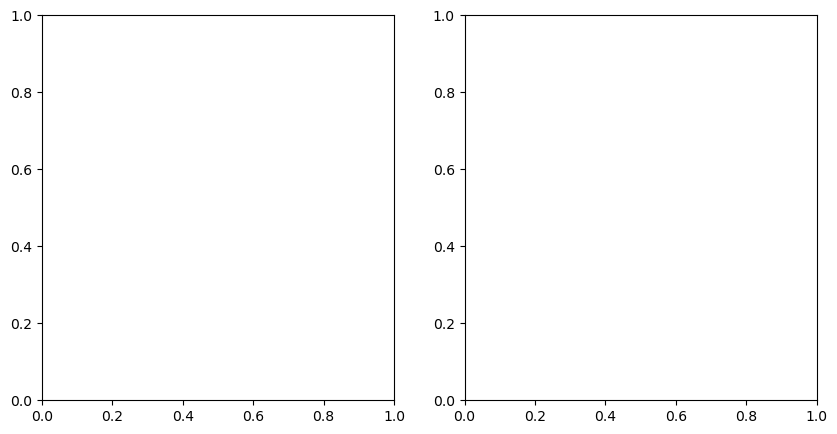

In [99]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))

ax=axes[0]
img = ax.pcolormesh(max_interpolated_vals.T)
# ax.plot(max_interpolated_vals)
ax.set_title('Convergence of estimated velocities\n within gappy velocity fields')
ax.set_xlabel('Iteration')
ax.set_ylabel('Velocity field')
col_ax = plt.colorbar(img)
col_ax.ax.set_ylabel('Maximum interpolated velocity (m/yr)')

ax=axes[1]

ax.plot(max_interpolated_vals)
ax.set_title('Convergence of estimated velocities\n within gappy velocity fields')
ax.set_xlabel('Iteration')
ax.set_ylabel('Maximum interpolated velocity (m/yr)')



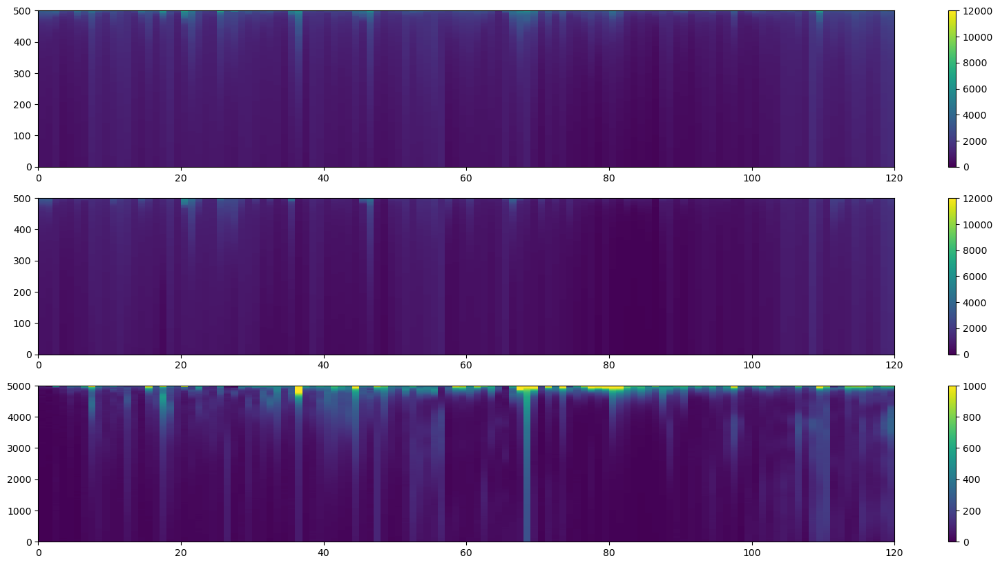

In [95]:
# Check the distributions of velAnomaly_xr_pd = velAnomaly_xr.stack(z=['x','y']).T.to_pandas()

# How many non-zero measurements are there in each 
xr.where(~np.isnan(velAnomaly_xr), 1, 0).sum(dim=['x', 'y']).to_numpy()


velAnomaly_fill_np = velAnomaly_fill.stack(z=['x','y']).T.to_numpy()
# velAnomaly_fill_np = velAnomaly_fill_np[
velAnomaly_xr_np = velAnomaly_xr.stack(z=['x','y']).T.to_numpy()
velAnomaly_xr_np[np.isnan(velAnomaly_xr_np)] = 0

fig, ax = plt.subplots(nrows=3, figsize=(20,10))
img = ax[0].pcolormesh(np.sort(velAnomaly_fill_np, axis=0)[169424-500:169424, :], vmin=0, vmax=12000)
# ax.set_ylim(169000, 169425)
plt.colorbar(img)

        # xr.where(~np.isnan(velAnomaly_xr), 1, 0).sum(dim=['x', 'y']).to_numpy()
img = ax[1].pcolormesh(np.sort(velAnomaly_xr_np, axis=0)[-500:, :], vmin=0, vmax=12000)
plt.colorbar(img)

img = ax[2].pcolormesh(np.sort(velAnomaly_fill_np, axis=0)[169424-5000:169424, :] - 
                       np.sort(velAnomaly_xr_np, axis=0)[-5000:, :] , vmin=0, vmax=1000)
plt.colorbar(img)


# velAnomaly_fill_pd = velAnomaly_fill.stack(z=['x','y']).T.to_pandas()
# velAnomaly_fill_pd.sort_values(ascending=False, inplace=True, na_position='last' )
# pd_merged = velAnomaly_xr_pd.merge(velAnomaly_fill_pd)

# fig, ax = plt.subplots(figsize=(20,5))
# plt.pcolormesh(velAnomaly_fill_pd.to_numpy())

# velAnomaly_xr_pd.iloc[:,:20].boxplot(ax=ax)#, ylim=(-200, 200))


# fig, ax = plt.subplots(figsize=(20,5))
# velAnomaly_xr_pd.iloc[:,:20].boxplot(ax=ax)#, ylim=(-200, 200))
# velAnomaly_fill_pd.iloc[:,:20].boxplot(ax=ax)#, ylim=(-200, 200))
# # ax.set_ylim(-200, 200)

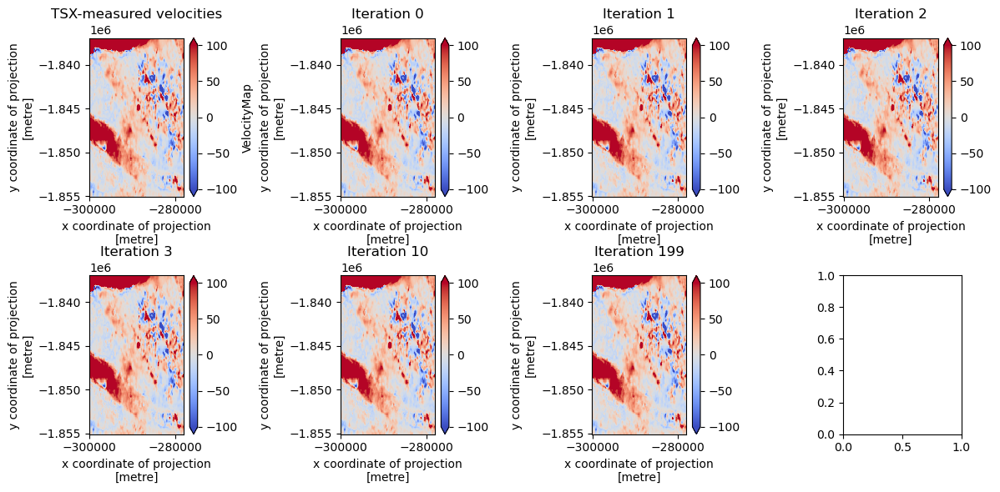

In [97]:
# Watch the convergence

iter_save_sub = iter_save.rio.write_crs(3413).rio.clip_box(minx= -300000, miny= -1855000, maxx= -278000, maxy= -1837000)
# xr.plot.pcolormesh(sub_vel[i,:,:])

fig, axes = plt.subplots(2,4, figsize=(12,6))
# for ax, i in zip(axes.flatten(), range(8)):
ax = axes.flatten()[0]
xr.plot.pcolormesh(velAnomaly_xr[i,:,:].rio.clip_box(minx= -300000, miny= -1855000, maxx= -278000, maxy= -1837000),
                   # iter_save_sub.sel(iteration=i),
                   ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
ax.set_title('TSX-measured velocities')

for ax, iteration in zip( axes.flatten()[1:], np.array([0,1,2,3,10,199]) ):
    # xr.plot.pcolormesh(iter_save[iteration,:,:], ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
    xr.plot.pcolormesh(iter_save_sub.sel(iteration=iteration), ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
    ax.set_title('Iteration ' + str(iteration))

# ax = axes.flatten()[-1]
# xr.plot.pcolormesh(reconstruction[i,:,:].rio.write_crs(3413).rio.clip_box(minx= -300000, miny= -1855000, maxx= -278000, maxy= -1837000),
#                    # iter_save_sub.sel(iteration=i),
#                    ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
# ax.set_title('EOF-reconstructed velocities\n(no measured data)')
    
fig.tight_layout()

In [ ]:
velAnomaly_xr[i,:,:]

In [ ]:
# velAnomaly_fill_final = velAnomaly_fill.copy(deep=True)

# velAnomaly_fill = velAnomaly.xr.copy(deep=True)

# velAnomaly_fill = velAnomaly_fill.fillna(0.0) # First fill missing values with 0s
# # Then go back and find the places where no data whatsoever is known and replace these with nans
# mean_anom = velAnomaly.xr.mean(dim='time', skipna=True)

# velAnomaly_fill = xr.where(mean_anom.isnull(), np.nan, velAnomaly_fill)
# velAnomaly_fill = velAnomaly_fill.transpose('time', 'band', 'y', 'x')

In [ ]:

i=93
fig, axes = plt.subplots(1,4, figsize=(18,5))
# Plot only the reconstruction where the data is not known
xr.plot.pcolormesh( xr.where(vel_is_null, reconstruction, np.nan)[i, 2, :,:], ax=axes[0], cmap='coolwarm', vmin=-100, vmax=100)

# Plot the anomaly
# xr.plot.pcolormesh(velAnomaly.xr[i,2,:,:], ax=axes[1])
xr.plot.pcolormesh(velAnomaly_fill[i,2,:,:], ax=axes[1], cmap='coolwarm', vmin=-100, vmax=100)

# Plot the reconstruction
# xr.plot.pcolormesh(velAnomaly_fill_final.where(vel_is_null, reconstruction)[i,2,:,:], ax=axes[2])
xr.plot.pcolormesh(velAnomaly_fill_final[i,2,:,:], ax=axes[2], cmap='coolwarm', vmin=-100, vmax=100)

# Plot only the reconstruction where the data is not known
xr.plot.pcolormesh( xr.where(vel_is_null, velAnomaly_fill_final-velAnomaly_fill, np.nan)[i, 2, :,:], ax=axes[3], cmap='coolwarm', vmin=-100, vmax=100)

In [ ]:
fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(22,11))
for i in range(len(vel_df)):
    col = i %  ax.shape[1]
    row = i // ax.shape[1]
    img = ax[row, col].imshow(reconstruction[i,:,:], 
                              cmap='coolwarm', vmin=-500, vmax=500)
    ax[row, col].set_title(vel_df.iloc[i].mid_date)
    ax[row, col].axis('off')
cax = plt.axes([.93, .03, .02, .84])
plt.colorbar(img, cax=cax)#ax[row, col])
cax.set_ylabel('Velocity anomaly (m/yr) \n (Positive is faster than mean)')
# plt.savefig('vel_reconstructed.png')

## Compare impact on a velocity time series

In [102]:
xpt = -285000
ypt = -1845000

# xpt = -270000
# ypt = -1855000


# xpt, ypt = -298, -1837 #250, -1530
# xpt, ypt = -298000, -1837000 #250, -1530 # This location


time = velAnomaly_xr.time.to_numpy()

infilled = (myVelSeries.xr.sel(band='vv').mean(dim="time") + velAnomaly_fill).sel(x=xpt, y=ypt).to_numpy()
initial = myVelSeries.xr.sel(band='vv').sel(x=xpt, y=ypt).to_numpy()

vel_pd = pd.DataFrame({'time':time, 'initial':initial, 'infilled':infilled})

[                                        ] | 0% Completed | 652.64 ms


RuntimeError: Error opening '/vsicurl/?list_dir=no&url=https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2019.06.17/TSX_W72.90N_17Jun19_28Jun19_20-34-34_vx_v04.0.tif': RasterioIOError("'/vsicurl/?list_dir=no&url=https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0481.004/2019.06.17/TSX_W72.90N_17Jun19_28Jun19_20-34-34_vx_v04.0.tif' not recognized as a supported file format.")

In [103]:
vel_pd = pd.DataFrame({'time':time, 'initial':initial, 'infilled':infilled})

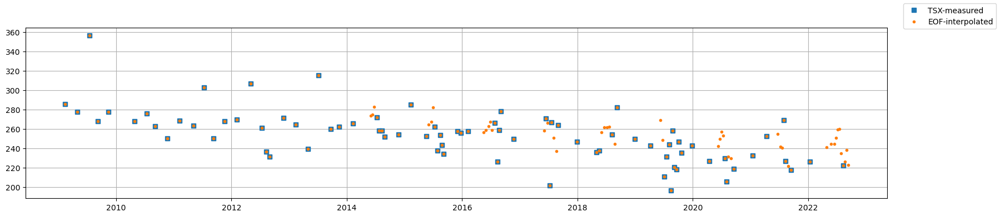

In [97]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(time, initial, 's', label='TSX-measured')
ax.plot(time, infilled, '.', label='EOF-interpolated')
fig.legend()
ax.grid('on')
# plt.savefig('More_complete_TS.png')

## Validate data through censoring

In [83]:
# to_plot = velAnomaly_fill.where((velAnomaly_fill.x >-290000) & (velAnomaly_fill.x <-280000) & 
#                                 (velAnomaly_fill.y > -1850000) & (velAnomaly_fill.y < -1840000)
#                                )
censored_coords = {'minx':-295000, 'maxx':-280000, 'miny':-1850000, 'maxy':-1835000}
index_time_to_censor = 30

# velAnomaly_censored = xr.where((velAnomaly_fill.x >-295000) & (velAnomaly_fill.x <-280000) & 
#                    (velAnomaly_fill.y > -1850000) & (velAnomaly_fill.y < -1835000) & 
velAnomaly_censored = xr.where((velAnomaly_fill.x > censored_coords['minx']) & (velAnomaly_fill.x < censored_coords['maxx']) & 
                   (velAnomaly_fill.y > censored_coords['miny']) & (velAnomaly_fill.y < censored_coords['maxy']) & 
                   (velAnomaly_xr.time == velAnomaly_xr.time[index_time_to_censor]),
                  np.nan, velAnomaly_xr)

#Censor second area in the north
censored_coords = {'minx':-300000, 'maxx':-285000, 'miny':-1825000, 'maxy':-1813000}
index_time_to_censor = 60
velAnomaly_censored = xr.where((velAnomaly_fill.x > censored_coords['minx']) & (velAnomaly_fill.x < censored_coords['maxx']) & 
                   (velAnomaly_fill.y > censored_coords['miny']) & (velAnomaly_fill.y < censored_coords['maxy']) & 
                   (velAnomaly_xr.time == velAnomaly_xr.time[index_time_to_censor]),
                  np.nan, velAnomaly_censored)



velAnomaly_censored = velAnomaly_censored.transpose('time', 'y', 'x')

### Identify optimal number of eofs

In [202]:
max_eofs_to_try = 15

for n_eofs_to_use in range(max_eofs_to_try):
    print('\n ---- EOFs to use:', str(n_eofs_to_use))
    velAnomaly_fill, iter_save, max_interpolated_vals_list = iterate_eofs_to_convergence(
        velAnomaly_censored, fill_value=85, n_eofs_to_use=n_eofs_to_use, 
        iters_to_run=300, example_time_ind=60, verbose=False)
    
    error_of_reconstruction = (velAnomaly_fill - velAnomaly_xr)

    error_of_reconstruction = error_of_reconstruction.to_numpy()
    error_of_reconstruction = error_of_reconstruction[error_of_reconstruction!=0.0]
    error_of_reconstruction = error_of_reconstruction[~np.isnan(error_of_reconstruction)]

    rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
    print('RMS error: ', rms_error_of_reconstruction)
    print('Mean error: ',  np.mean(error_of_reconstruction) )


 ---- EOFs to use: 0
225 0.0 0.0
301 0.0 0.0
RMS error:  89.48757
Mean error:  17.346106

 ---- EOFs to use: 1
225 2.1396484 3419.4766
301 0.8671875 3419.486
RMS error:  42.93179
Mean error:  -1.2034283

 ---- EOFs to use: 2
225 23.089844 7882.885
301 19.59961 9410.296
RMS error:  47.371567
Mean error:  22.171885

 ---- EOFs to use: 3
225 36.532227 8108.254
301 38.487305 9391.449
RMS error:  41.164318
Mean error:  18.197895

 ---- EOFs to use: 4
225 42.126953 14164.919
301 32.55664 16987.107
RMS error:  33.46854
Mean error:  13.618896

 ---- EOFs to use: 5
225 20.025879 14602.6
301 17.615723 15212.985
RMS error:  34.067192
Mean error:  9.959536

 ---- EOFs to use: 6
225 21.81836 13746.343
301 18.32666 15101.95
RMS error:  35.573143
Mean error:  11.08837

 ---- EOFs to use: 7
225 70.46399 16379.948
301 46.740723 17253.09
RMS error:  30.441965
Mean error:  8.836294

 ---- EOFs to use: 8
225 30.84961 10530.867
301 24.03418 12607.911
RMS error:  30.913584
Mean error:  6.3534985

 ---- EOF

In [238]:
velAnomaly_fill, iter_save, max_interpolated_vals_list = iterate_eofs_to_convergence(
    velAnomaly_censored, fill_value=-500, n_eofs_to_use=n_eofs_to_use, 
    iters_to_run=20, example_time_ind=60, verbose=False)

error_of_reconstruction = (velAnomaly_fill - velAnomaly_xr)

error_of_reconstruction = error_of_reconstruction.to_numpy()
error_of_reconstruction = error_of_reconstruction[error_of_reconstruction!=0.0]
error_of_reconstruction = error_of_reconstruction[~np.isnan(error_of_reconstruction)]

rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
print('RMS error: ', rms_error_of_reconstruction)
print('Mean error: ',  np.mean(error_of_reconstruction) )

15 330.5078 6246.3853
21 252.84668 7136.894
RMS error:  37.78567
Mean error:  -10.477893


In [84]:
max_eofs_to_try = 50

for n_eofs_to_use in range(14, max_eofs_to_try):
    print('\n ---- EOFs to use:', str(n_eofs_to_use))
    velAnomaly_fill, iter_save, max_interpolated_vals_list = iterate_eofs_to_convergence(
        velAnomaly_censored, fill_value=85, n_eofs_to_use=n_eofs_to_use, 
        iters_to_run=300, example_time_ind=60, verbose=False)
    
    error_of_reconstruction = (velAnomaly_fill - velAnomaly_xr)

    error_of_reconstruction = error_of_reconstruction.to_numpy()
    error_of_reconstruction = error_of_reconstruction[error_of_reconstruction!=0.0]
    error_of_reconstruction = error_of_reconstruction[~np.isnan(error_of_reconstruction)]

    rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
    print('RMS error: ', rms_error_of_reconstruction)
    print('Mean error: ',  np.mean(error_of_reconstruction) )


 ---- EOFs to use: 14
225 30.791992 15347.485
301 22.245117 17290.01
RMS error:  30.94297
Mean error:  4.3436503

 ---- EOFs to use: 15
225 31.894531 12780.885
301 27.289062 15023.55
RMS error:  29.392664
Mean error:  0.40735054

 ---- EOFs to use: 16
225 23.104492 11190.691
301 22.990723 10789.586
RMS error:  29.976242
Mean error:  1.4791824

 ---- EOFs to use: 17
225 27.875977 11250.728
301 24.788086 11899.068
RMS error:  31.682686
Mean error:  3.3402207

 ---- EOFs to use: 18
225 28.811523 11416.485
301 31.294434 12878.841
RMS error:  32.88217
Mean error:  3.9824495

 ---- EOFs to use: 19
225 30.541504 13298.391
301 30.46875 14530.928
RMS error:  33.674755
Mean error:  4.7341614

 ---- EOFs to use: 20
225 24.841797 11786.586
301 19.838867 12725.781
RMS error:  33.337654
Mean error:  2.523497

 ---- EOFs to use: 21
225 21.473145 9509.621
301 19.320312 9791.605
RMS error:  33.905
Mean error:  2.1857464

 ---- EOFs to use: 22
225 19.769287 9904.297
301 19.546875 10986.453
RMS error:  

KeyboardInterrupt: 

In [ ]:
arr = numpy.zeros((50,100,25))
new_arr = arr.reshape(-1, arr.shape[-1])

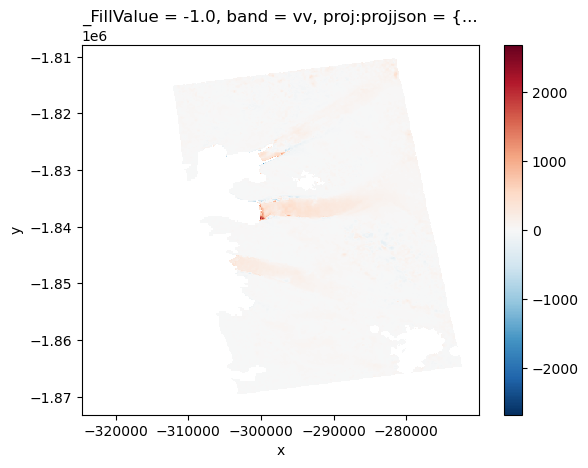

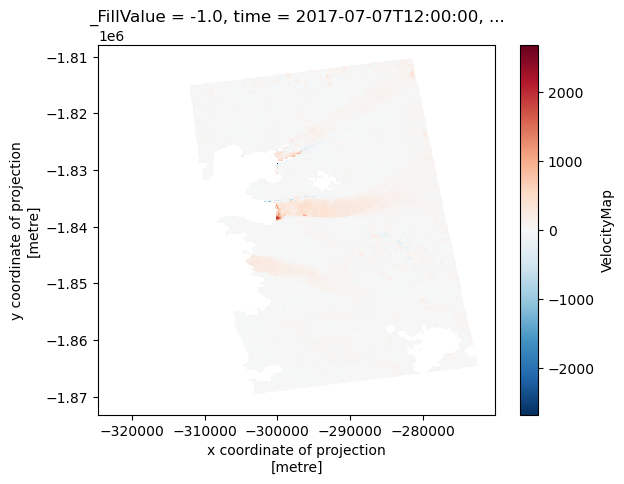

In [ ]:
xr.plot.pcolormesh(to_plot.isel(time=index_time_to_censor) )
plt.figure()
xr.plot.pcolormesh(velAnomaly_xr.isel(time=index_time_to_censor) )

In [137]:
# focus_band = 'vv'



# vel_is_null = velAnomaly_censored.isnull()

# velAnomaly_fill = velAnomaly_censored.copy(deep=True)

# velAnomaly_fill = velAnomaly_fill.fillna(87)#-100.0) # First fill missing values with 0s
# # Then go back and find the places where no data whatsoever is known and replace these with nans
# mean_vel_xr = velAnomaly_censored.mean(dim='time', skipna=True) # Find the mean of the 
# # velAnomaly_fill = xr.where(vel_is_null, np.nan, velAnomaly_fill)
# velAnomaly_fill = xr.where(mean_vel_xr.isnull(), np.nan, velAnomaly_fill)
# velAnomaly_fill = velAnomaly_fill.transpose('time', 'y', 'x')


# solver = Eof(velAnomaly_fill, center=True)

# n_eofs_to_use = 10 # Number of "trusted" EOFs to use to fill values
# reconstruction = solver.reconstructedField(n_eofs_to_use)

# delta_field = reconstruction - velAnomaly_fill # How different is the reconstructed field from the zero-filled field?

# # i = 14# 2 # Which measures velocity geotiff to look at, for testing/plotting
# # i = 27
# i = index_time_to_censor

In [138]:
# iter_save = velAnomaly_fill[i,:,:].expand_dims(dim={'iteration':np.arange(400)}, axis=0).copy(deep=True, data=None)


# max_interpolated_vals_list = []

# # Do this while loop until the solution is "sufficiently" good
# counter=0
# while counter <= 400:#xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10:

# # while xr.where(vel_is_null, delta_field, np.nan).max().to_numpy() > 10: # Iterate to ensure that the reconstructed velocities approximate the interpolated velocities
#                     # while np.nanmax(delta_field[np.isnan(anom_vol)]) > 10:
#     # Consider the delta_field, at the locations where measurements do not exist.
#     # Identify the maximum value of the size of the update to the infilled anomaly maps (max(delta_field))
#     # Keep looping, until the size of the updates is small (i.e., less than 5).
    
#     iter_save[counter,:,:] = velAnomaly_fill[i,:,:].copy()
    
#     counter+=1
#     print(counter, xr.where(vel_is_null, delta_field, np.nan).max().to_numpy())
#     print('   Max of EOF interpolated velocity: ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max().to_numpy(),
#           '   ', xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy().astype('int') )
#     max_interpolated_vals_list.append(xr.where(vel_is_null, velAnomaly_fill, np.nan).max(dim=["x", "y"]).to_numpy())
#     print( '   Max of diff between reconstructed and interpolated velocities', (xr.where(vel_is_null, delta_field, np.nan).max(dim=["x", "y"]).to_numpy()).astype('int') )
#     # delta_field_i = delta_field[i,:,:] # track one image's delta
#     # print( '   ', abs(xr.where(vel_is_null, delta_field_i, np.nan)).mean().to_numpy() ,
#     #               xr.where(vel_is_null, delta_field_i, np.nan).max().to_numpy() )
#     print( '   ', abs(xr.where(vel_is_null[i,:,:], delta_field[i,:,:], np.nan)).mean().to_numpy() ,
#                   xr.where(vel_is_null[i,:,:], delta_field[i,:,:], np.nan).max().to_numpy() )
#     # print( '   ', np.nanmean(np.abs( delta_field_i[np.isnan(velAnomaly[i,:,:])] )) ,
#           # np.nanmax( delta_field_i[np.isnan(velAnomaly[i,:,:])] ) )
    

#     # ------------------
#     # This trio of lines is really the crux, that is iterated over:
#         # Use the reconstruction to update the infilled anomalies
#         # Calculate the new EOFs with infilled anomalies
#         # Create a new reconstruction based on the new EOFs
        
#     velAnomaly_fill = xr.where(vel_is_null, reconstruction, velAnomaly_xr) # Where we don't have measurements, assign the infilled data to be the reconstruction
#         # velAnomaly_fill.where(vel_is_null) = reconstruction.where(velAnomaly.xr.isnull()) # Where we don't have measurements, assign the infilled data to be the reconstruction
#     solver = Eof(velAnomaly_fill, center=False) # With the infilled data, solve the EOFs.
#     reconstruction = solver.reconstructedField(n_eofs_to_use) # Reconstruct the anomalies, based on these new EOFs.
#     # ------------------
#     delta_field = reconstruction - velAnomaly_fill # how much have the reconstructions deviated from the infilled data.
#     # This is a measure of the size of the update, accomplished during each loop iteration.
    
# #     # fig, ax = plt.subplots(ncols=2)
# #     # ax[0].imshow(anom_vol[i,:,:], 
# #     #              cmap='coolwarm', vmin=-400, vmax=400)
# #     # ax[1].imshow(reconstruction[i,:,:], 
# #     #              cmap='coolwarm', vmin=-400, vmax=400)
    
# #     # fig, axes = plt.subplots(ncols=2)
# #     # axes[0].imshow(anom_vol[i,:,:], 
# #     #              cmap='coolwarm', vmin=-400, vmax=400)
# #     # axes[1].imshow(delta_field[i,:,:], 
# #     #              cmap='coolwarm', vmin=-50, vmax=50)
    
# #     # fig, ax = plt.subplots(ncols=2)
# #     # # ax[0].imshow(anom_vol[i,:,:], 
# #     # #              cmap='coolwarm', vmin=-400, vmax=400)
# #     # # ax[0].imshow(delta_field[i,:,:], 
# #     # #              cmap='coolwarm', vmin=-50, vmax=50)
# #     # ax[0].imshow(np.ma.masked_array(reconstruction[i,:,:], ~np.isnan(anom_vol[i,:,:])), 
# #     #              cmap='coolwarm', vmin=-5, vmax=5)
# #     # ax[1].imshow(np.ma.masked_array(delta_field_i, ~np.isnan(anom_vol[i,:,:])), 
# #     #              cmap='coolwarm', vmin=-5, vmax=5)
    
    
# #     # i=40
# #     fig, axes = plt.subplots(1,4, figsize=(18,5))
# #     # Plot only the reconstruction where the data is not known
# #     # xr.plot.pcolormesh( xr.where(vel_is_null, reconstruction, np.nan)[i, :,:], ax=axes[0], cmap='coolwarm')#, vmin=-100, vmax=100)
# #     xr.plot.pcolormesh( reconstruction[i, :,:], ax=axes[0], cmap='coolwarm', vmin=-100, vmax=100)
    
# #     # Plot the anomaly
# #     # xr.plot.pcolormesh(velAnomaly.xr[i,2,:,:], ax=axes[1])
# #     xr.plot.pcolormesh(velAnomaly_xr[i,:,:], ax=axes[1], cmap='coolwarm', vmin=-100, vmax=100)
    
# #     # Plot the reconstruction
# #     # xr.plot.pcolormesh(velAnomaly_fill_final.where(vel_is_null, reconstruction)[i,2,:,:], ax=axes[2])
# #     xr.plot.pcolormesh(velAnomaly_fill[i,:,:], ax=axes[2], cmap='coolwarm', vmin=-100, vmax=100)

# #     # Plot only the reconstruction where the data is not known
# #     delta_field[i,:,:]
# #     xr.plot.pcolormesh( xr.where(vel_is_null, delta_field, np.nan)[i, :,:], ax=axes[3], cmap='coolwarm')#, vmin=-100, vmax=100)

1 2039.2546
   Max of EOF interpolated velocity:  87.0     [87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87
 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87
 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87
 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87
 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87]
   Max of diff between reconstructed and interpolated velocities [ 248  694 1224 1330  915 2039 1150  582  681  594  648 1116 1028  562
  851 1097  868  559  743  508 1175 1941 1284  699  935 1237  794  969
 1127  610 1126  447  862  436  374  944  363  252  636  567  408  405
  347  432  367  525 1679  257  245  501  647  609  499  741  914  878
  869  202  267  344  463  498  427  533  473  710 1480  741  303  351
  210  390  378  347  316  846  736  270  186  260  358  558  247  201
  321  127  213  377  281  520  451  375  338  323  428  421  320  294
  372  502  5

IndexError: index 400 is out of bounds for axis 0 with size 400

### Plot convergence after the data have been censored, then infilled

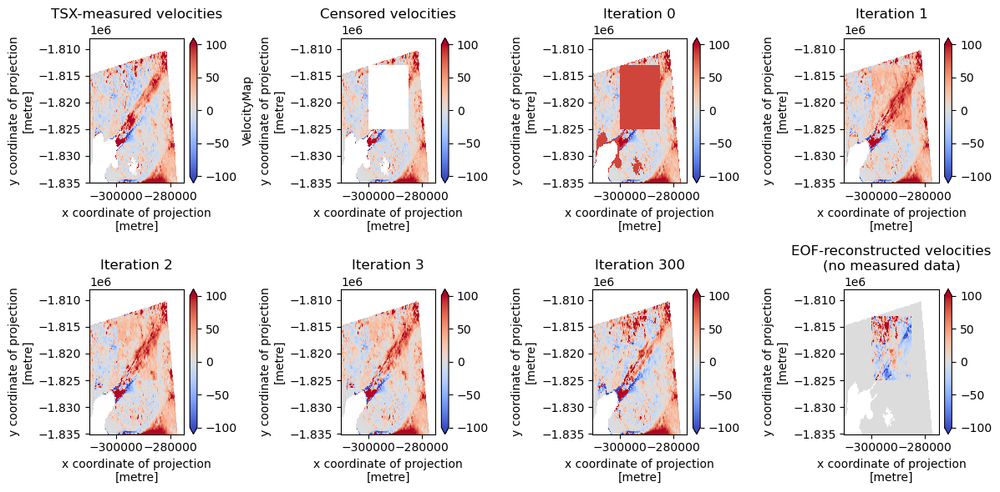

In [92]:
# Watch the convergence
plot_buffer = 1e4 # m around the censored data to include in the view.
i=60

# iter_save_sub = iter_save.rio.write_crs(3413).rio.clip_box(minx= -300000, miny= -1855000, maxx= -278000, maxy= -1837000)
iter_save_sub = iter_save.rio.write_crs(3413).rio.clip_box(minx= censored_coords['minx']-plot_buffer, 
                                                           miny= censored_coords['miny']-plot_buffer,
                                                           maxx= censored_coords['maxx']+plot_buffer,
                                                           maxy= censored_coords['maxy']+plot_buffer)
# xr.plot.pcolormesh(sub_vel[i,:,:])

fig, axes = plt.subplots(2,4, figsize=(12,6))
# for ax, i in zip(axes.flatten(), range(8)):
ax = axes.flatten()[0]
xr.plot.pcolormesh(velAnomaly_xr[i,:,:].rio.clip_box(minx= censored_coords['minx']-plot_buffer,
                                                     miny= censored_coords['miny']-plot_buffer,
                                                     maxx= censored_coords['maxx']+plot_buffer,
                                                     maxy= censored_coords['maxy']+plot_buffer),
                   # iter_save_sub.sel(iteration=i),
                   ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
ax.set_title('TSX-measured velocities')

ax = axes.flatten()[1]
xr.plot.pcolormesh(velAnomaly_censored[i,:,:].rio.write_crs(3413).rio.clip_box(minx= censored_coords['minx']-plot_buffer,
                                                     miny= censored_coords['miny']-plot_buffer,
                                                     maxx= censored_coords['maxx']+plot_buffer,
                                                     maxy= censored_coords['maxy']+plot_buffer),
                   # iter_save_sub.sel(iteration=i),
                   ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
ax.set_title('Censored velocities')

for ax, iteration in zip( axes.flatten()[2:], np.array([0,1,2,3,300]) ):
    # xr.plot.pcolormesh(iter_save[iteration,:,:], ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
    xr.plot.pcolormesh(iter_save_sub.sel(iteration=iteration), ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
    ax.set_title('Iteration ' + str(iteration))

    
ax = axes.flatten()[-1]
xr.plot.pcolormesh((velAnomaly_fill - velAnomaly_xr).isel(time=i).rio.write_crs(3413).rio.clip_box(minx= censored_coords['minx']-plot_buffer, 
                                                           miny= censored_coords['miny']-plot_buffer,
                                                           maxx= censored_coords['maxx']+plot_buffer,
                                                           maxy= censored_coords['maxy']+plot_buffer),
                   # iter_save_sub.sel(iteration=i),
                   ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
ax.set_title('EOF-reconstructed velocities\n(no measured data)')
    
# ax = axes.flatten()[-1]
# xr.plot.pcolormesh(reconstruction[i,:,:].rio.write_crs(3413).rio.clip_box(minx= censored_coords['minx']-plot_buffer, 
#                                                            miny= censored_coords['miny']-plot_buffer,
#                                                            maxx= censored_coords['maxx']+plot_buffer,
#                                                            maxy= censored_coords['maxy']+plot_buffer),
#                    # iter_save_sub.sel(iteration=i),
#                    ax=ax, vmin=-100, vmax=100, center=0, cmap='coolwarm')
# ax.set_title('EOF-reconstructed velocities\n(no measured data)')
    
fig.tight_layout()

In [167]:
error_of_reconstruction = (velAnomaly_fill - velAnomaly_xr)#.isel(time=index_time_to_censor)
# error_of_reconstruction = error_of_reconstruction.rio.write_crs(3413).rio.clip_box(minx= censored_coords['minx']-plot_buffer, 
#                                                            miny= censored_coords['miny']-plot_buffer,
#                                                            maxx= censored_coords['maxx']+plot_buffer,
#                                                            maxy= censored_coords['maxy']+plot_buffer)
error_of_reconstruction = error_of_reconstruction.to_numpy()
error_of_reconstruction = error_of_reconstruction[error_of_reconstruction!=0.0]
error_of_reconstruction = error_of_reconstruction[~np.isnan(error_of_reconstruction)]

35.276848
8.375368


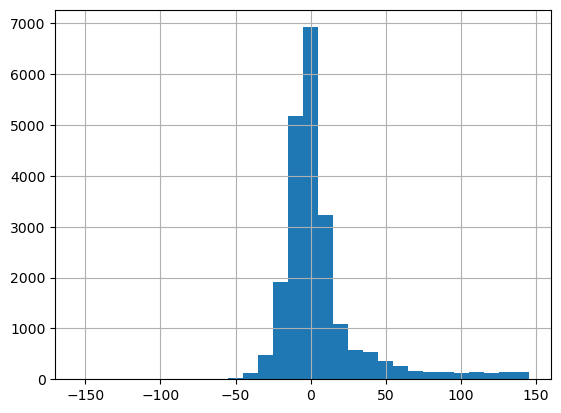

In [168]:
rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
print(rms_error_of_reconstruction)
print( np.mean(error_of_reconstruction) )

fig, ax = plt.subplots()
ax.hist(error_of_reconstruction, bins = np.arange(-155, 155, 10))
ax.grid()

29.088589
9.755652


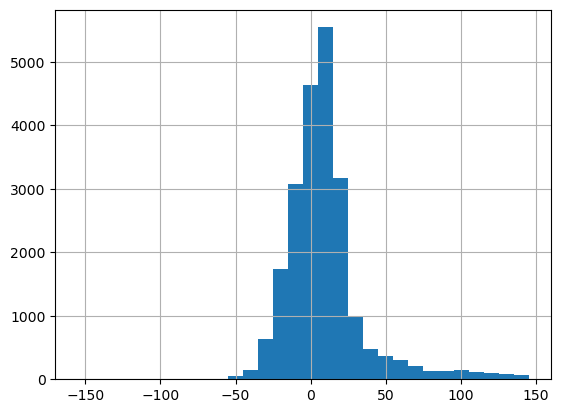

In [89]:
rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
print(rms_error_of_reconstruction)
print( np.mean(error_of_reconstruction) )

fig, ax = plt.subplots()
ax.hist(error_of_reconstruction, bins = np.arange(-155, 155, 10))
ax.grid()

31.750984
11.156154


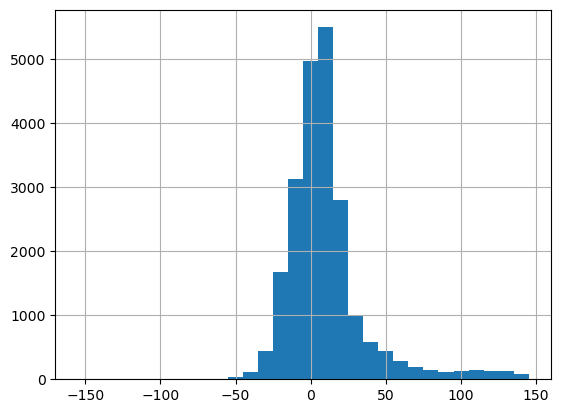

In [118]:
rms_error_of_reconstruction = np.sqrt( np.mean(error_of_reconstruction**2) )
print(rms_error_of_reconstruction)
print( np.mean(error_of_reconstruction) )

fig, ax = plt.subplots()
ax.hist(error_of_reconstruction, bins = np.arange(-155, 155, 10))
ax.grid()

# End of Tim mods

In [ ]:
# set up figure and axis
#%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(21, 12))

# Create a dictionary for accumulating glacier points
glacierPoints = {}
# generate a color dict that spans all flowline ids, using method from a flowline instance
flowlineColors = list(myFlowlines.values())[0].genColorDict(flowlineIDs=flowlineIDs)
# Plot velocity maps
# Saturate at 2000 m/yr to preserve slow detail
myVelSeries.displayVelForDate('2020-01-01', ax=axes[0], labelFontSize=12, plotFontSize=9, titleFontSize=14, 
                              vmin=0, vmax=2000, units='km', scale='linear', colorBarSize='3%') 
myVelSeries.displayVelForDate('2020-01-01', ax=axes[1], labelFontSize=12, plotFontSize=9, titleFontSize=14, 
                              vmin=1, vmax=3000, units='m', scale='log', midDate=False, colorBarSize='3%')
# Plot location inset
height = 3
axInset = inset_axes(axes[0], width=height * myOverview.sx/myOverview.sy, height=height, loc=1)
myOverview.displayVelForDate(None, ax=axInset, vmin=1, vmax=3000, colorBar=False, scale='log', title='')
axInset.plot(*myVelSeries.outline(), color='r')
axInset.axis('off')
#
# Loop over each glacier and plot the flowlines
for glacierId in myFlowlines:
    # Plot the flowline Match units to the map
    myFlowlines[glacierId].plotFlowlineLocations(ax=axes[0], units='km', colorDict=flowlineColors)
    myFlowlines[glacierId].plotFlowlineLocations(ax=axes[1], units='m', colorDict=flowlineColors)
    # 
    myFlowlines[glacierId].plotGlacierName(ax=axes[0], units='km', color='w', fontsize=12,fontweight='bold', first=False)
    myFlowlines[glacierId].plotGlacierName(ax=axes[1], units='m', color='w', fontsize=12,fontweight='bold', first=False)
    # Generates points 10km from downstream end of each flowline
    points10km = myFlowlines[glacierId].extractPoints(10, None, units='km')
    glacierPoints[glacierId] = points10km
    for key in points10km:
        axes[0].plot(*points10km[key], 'r.')
#
# Add legend
for ax in axes:
    # Create a dict of unique labels for legend
    h, l = ax.get_legend_handles_labels()
    by_label = dict(zip(l, h)) # will overwrite identical entries to produce unique values
    ax.legend(by_label.values(), by_label.keys(), title='Flowline ID', ncol=2, loc='lower left', fontsize=14)
#fig.tight_layout()

### Interpolation

A common function with the velocity date is interpolating data for plotting points or profiles, which can be easily done with the `nisarVelSeries.interp` method.

In [ ]:
dir(myFlowlines['0001'])
myFlowlines['0001'].checkUnits('km')

In [ ]:
# Using km
# vx, vy, vv = myVelSeries.interp(*myFlowlines[glacierId].xykm(), units='km')
vx, vy, vv = myVelSeries.interp(*myFlowlines[glacierId].xy(), units='km')
print(vx.shape, vx[0, 100], vy[0, 100], vv[0, 100])

# or units of meters
# vx, vy, vv = myVelSeries.interp(*myFlowlines[glacierId].xym(), units='m')
vx, vy, vv = myVelSeries.interp(*myFlowlines[glacierId].xy(), units='m')
print(vx.shape, vx[0, 100], vy[0, 100], vv[0, 100])
# or entirely different coordinate system
xytoll = pyproj.Transformer.from_crs(3413, 4326)
# lat, lon = xytoll.transform(*myFlowlines[glacierId].xym())
lat, lon = xytoll.transform(*myFlowlines[glacierId].xy())
vx, vy, vv = myVelSeries.interp(lat, lon, sourceEPSG=4326)
print(vx.shape, vx[0, 100], vy[0, 100], vv[0, 100])
# Or would prefer an xarray rather than nparray
# result = myVelSeries.interp(*myFlowlines[glacierId].xykm(), units='km', returnXR=True)
result = myVelSeries.interp(*myFlowlines[glacierId].xy(), units='km', returnXR=True)
result

### Plot Central Flowlines at Different Times

This example will demonstrate plotting the nominally central flowline ('06') for each of the six years for which there are currently data. While we are using flow lines here, any profile data could be used (e.g., a flux gate). 

In [ ]:
flowlineId ='06'  # Flowline id to plot
fig, axes = plt.subplots(np.ceil(len(myFlowlines)/4).astype(int), 2, figsize=(16, 8))  # Setup plot
# Loop over glaciers
for glacierId, ax in zip(myFlowlines, axes.flatten()):
    #
    # return interpolated values as vx(time index, distance index)
    vx, vy, vv = myVelSeries.interp(*myFlowlines[glacierId].xykm(), units='km')
    #
    # loop over each profile by time
    for speed, myDate in zip(vv, myVelSeries.time):
        ax.plot(myFlowlines[glacierId].distancekm(), speed, label=myDate.year)
    #
    # pretty up plot
    ax.legend(ncol=2, loc='upper right', fontsize=15)
    ax.set_xlabel('Distance (km)', fontsize=18)
    ax.set_ylabel('Speed (m/yr)', fontsize=18)
    ax.set_title(f'Glacier {glacierId}', fontsize=20)
#
# Resize tick labels 
for ax in axes.flatten():
    ax.tick_params(axis='both', labelsize=15)
plt.tight_layout()

### Plot Points Through Time

<a id='points'></a>When the map plots were generated [above](#mapplot), a set of points 10-k from the start of each flowline was extracted:

In [ ]:
glacierPoints

The time series for each set of. points can be plotted as:

In [ ]:
#%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
# Loop over glaciers
for glacierId, ax in zip(glacierPoints, axes.flatten()):
    # Loop over flowlines
    for flowlineId in glacierPoints[glacierId]:
        #
        # interpolate to get results vx(time index) for each point
        vx, vy, v = myVelSeries.interp(*glacierPoints[glacierId][flowlineId], units='km')
        ax.plot(myVelSeries.time, v, marker='o',  linestyle='-', color=flowlineColors[flowlineId],label=f'{flowlineId}')
    #
    # pretty up plot
    ax.legend(ncol=3, loc='upper right', title='Flowline ID')
    ax.set_xlabel('year', fontsize=18)
    ax.set_ylabel('Speed (m/yr)', fontsize=18)
    ax.set_title(f'Glacier {glacierId}', fontsize=20)
#
# Resize tick labels 
for ax in axes.flatten():
    ax.tick_params(axis='both', labelsize=15)
plt.tight_layout()

### Save the Data

While it is convenient to work the date remotely, its nice to be be able to save the data for further processing.

The downloaded subset can be saved in a netcdf and reloaded for to `velSeries` instance for later analysis. 

Note makes sure the data have been subsetted so only the the subset will be saved (~15MB in this example). If not, the entire Greeland data set will be saved (370GB). 

Change `saveData` and `reloadData` below to test this capability.

In [ ]:
saveData = True # Set to True to save data
if saveData:
    myVelSeries.toNetCDF('Glaciers1-2example.nc')

Now open open the file and redo a plot from above with the saved data.

In [ ]:
reloadData = True  # Set to True to reload the saved data
if reloadData:
    fig, axes = plt.subplots(np.ceil(len(myFlowlines)/2).astype(int), 2, figsize=(16, 8))  # Setup plot
    myVelCDF = nisar.nisarVelSeries() # Create Series
    myVelCDF.readSeriesFromNetCDF('Glaciers1-2example.nc')
    #
    for glacierId, ax in zip(myFlowlines, axes.flatten()):
        # return interpolated values as vx(time index, distance index)
        vx, vy, vv = myVelCDF.interp(*myFlowlines[glacierId].xykm(), units='km')
        # loop over each profile by time
        for speed, myDate in zip(vv, myVelSeries.time):
            ax.plot(myFlowlines[glacierId].distancekm(), speed, label=myDate.year)
        # pretty up plot
        ax.legend(ncol=2, loc='upper right', fontsize=15)
        ax.set_xlabel('Distance (km)', fontsize=18)
        ax.set_ylabel('Speed (m/yr)', fontsize=18)
        ax.set_title(f'Glacier {glacierId}', fontsize=20)
# For other combinations could have 
    for ax in axes.flatten():
        ax.tick_params(axis='both', labelsize=15)
    plt.tight_layout()

### Summary for GrIMP Data

Using the [nisardev](https://github.com/fastice/nisardev) and [grimp](https://github.com/fastice/grimpfunc) we were easily able to perform many of the typical functions needed for the analysis of glaciers by accesssing remote [GrIMP data](https://nsidc.org/data/measures/grimp) such as:
- Accessing stacks of velocity data;
- Display velocity maps; and
- Interpolating data to points or lines;

When working with larger data sets (e.g., the 300+ [6/12 day velocity maps](https://nsidc.org/data/measures/grimp) at NSIDC), downloads can take longer (several minutes), but are still 2 to 3 orders of magnitude faster than downloading the full data set. 

Once downloaded, the data are easily saved for later use.

Other notebooks demonstrated the use of these tools are available through [GrIMPNotebooks](https://github.com/fastice/GrIMPNotebooks) repo at github.

As mentioned above, velocity data can help provide context for elevation change measurements. Next we look at elevation change for the Jakobshavn region.

## Comparing ICESat-2 Data with Other Datasets


Last time, we did a bit of work to add ICESat-2 and Operation Icebridge data to Pandas Dataframes. We only covered the basic operations that you can do with Pandas, so today we are going to do a more thorough analysis of the data here.

Since we already downloaded the ICESat-2/ATM files of interest, we are not going to use icepyx just yet - we will go ahead and reload the data from yesterday.

(Prompt) I forgot how to load the ICESat-2 data from a .h5 file. What do I need to do?

(Prompt) I also forgot how to load the ATM data. How do I read the CSV?

We established last time that ATM aligns best with the central ICESat-2 beams, particularly the central strong beam (GT2L). Let's see if that is reflected in the elevation profiles...

In [ ]:
# Load the ICESat-2 data
is2_file = 'processed_ATL06_20190420093051_03380303_005_01_full.h5'
with h5py.File(is2_file, 'r') as f:
    is2_gt2r = pd.DataFrame(data={'lat': f['gt2r/land_ice_segments/latitude'][:],
                                  'lon': f['gt2r/land_ice_segments/longitude'][:],
                                  'elev': f['gt2r/land_ice_segments/h_li'][:]}) # Central weak beam
    is2_gt2l = pd.DataFrame(data={'lat': f['gt2l/land_ice_segments/latitude'][:],
                                  'lon': f['gt2l/land_ice_segments/longitude'][:],
                                  'elev': f['gt2l/land_ice_segments/h_li'][:]}) # Central strong beam
    
# Load the ATM data
atm_file = 'ILATM2_20190506_151600_smooth_nadir3seg_50pt.csv'
atm_l2 = pd.read_csv(atm_file)

# Look only at the nadir track
atm_l2 = atm_l2[atm_l2['Track_Identifier']==0]

# Change the longitudes to be consistent with ICESat-2
atm_l2['Longitude(deg)'] -= 360

In [ ]:
# Subset the ICESat-2 data to the ATM latitudes
is2_gt2r = is2_gt2r[(is2_gt2r['lat']<atm_l2['Latitude(deg)'].max()) & (is2_gt2r['lat']>atm_l2['Latitude(deg)'].min())]
is2_gt2l = is2_gt2l[(is2_gt2l['lat']<atm_l2['Latitude(deg)'].max()) & (is2_gt2l['lat']>atm_l2['Latitude(deg)'].min())]

In [ ]:
# Make a 2D plot of along-track surface height
import matplotlib.pyplot as plt

#%matplotlib widget
fig, ax = plt.subplots(1, 1)
plt.plot(is2_gt2r['lat'], is2_gt2r['elev'], label='gt2r')
plt.plot(is2_gt2l['lat'], is2_gt2l['elev'], label='gt2l')
plt.plot(atm_l2['Latitude(deg)'], atm_l2['WGS84_Ellipsoid_Height(m)'], label='atm')
plt.xlabel('latitude')
plt.ylabel('elevation [m]')
plt.xlim([69.185, 69.275])
plt.ylim([100, 550])
plt.legend()
plt.show()

Sure enough, GT2L and ATM match very well! Since they are very close to each other, we can do a quick accuracy assessment between the two.

The ATM DataFrame is larger than the ICESat-2 dataframe, so we're going to apply a simple spline interpolant to downscale the ICESat-2 data.

In [ ]:
from scipy.interpolate import splrep,splev
fig, ax = plt.subplots(1, 1)
# Apply a spline interpolant to the ICESat-2 data
spl = splrep(is2_gt2l['lat'], is2_gt2l['elev'], s=0)
is2_spl = splev(atm_l2['Latitude(deg)'], spl, der=0)

# Calculate GT2L bias and add it to the ATM DataFrame
atm_l2['bias'] = atm_l2['WGS84_Ellipsoid_Height(m)'] - is2_spl
# Plot the bias curve
plt.plot(atm_l2['Latitude(deg)'], atm_l2['bias'])
#plt.plot(atm_l2['Latitude(deg)'], atm_l2['WGS84_Ellipsoid_Height(m)'])
#plt.plot(atm_l2['Latitude(deg)'], is2_spl)
plt.xlabel('latitude')
plt.ylabel('bias [m]')
plt.xlim([69.2, 69.26])
plt.ylim([-20, 20])
plt.show()

print('Mean bias: %s m' %(atm_l2['bias'].mean()))

Through some relatively simple operations, we found that ATM and ICESat-2 differ by ~0.33 m on average. Between this plot and the elevation plot above, what do you think might be causing some of the differences?

We will revisit ICESat-2 and ATM near the end of this tutorial. Now, we are going to look at ice velocities and flow lines from the GRIMP project.

### Visualization

We are now going to revisit the GRIMP data one last time to visualize all of the data together. We have conducted a bias assessment between the two lidars, so now we are going to look at how the land ice heights change over time.

First let's take a look at ATM data from previous years. The CSV file we are going to use is pre-processed L2 data for 2011-2018, much like the data from 2019. These flights are slightly east of the 2019 flight, which was adjusted to better align with ICESat-2.

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
# Read in the ATM CSV file
atm_2011_2018 = pd.read_csv('ILATM2_2011_2019_v3.csv')
lltoxy = pyproj.Transformer.from_crs(4326, 3413)

#%matplotlib widget
# Loop through the valid years and plot surface height
years = ['2011', '2013', '2014', '2015', '2016', '2018']
for i,year in enumerate(years):
    lat = atm_2011_2018['Latitude_'+year]
    elev = atm_2011_2018['elev_'+year]
    axes[1].plot(lat, elev, label=year)
#
#
myVelSeries.displayVelForDate('2020-01-01', ax=axes[0], labelFontSize=12, plotFontSize=9, titleFontSize=14, 
                              vmin=1, vmax=3000, units='m', scale='log', midDate=False, colorBarSize='3%', colorBarPosition='bottom')
axes[0].axis('off')
lltoxy = pyproj.Transformer.from_crs(4326, 3413)
for i, year in enumerate(years[3:]):
    lat, lon = atm_2011_2018['Latitude_'+year], atm_2011_2018['Longitude_'+year]
    x, y = lltoxy.transform(lat, lon)
    axes[0].plot(x, y, 'w', linewidth=2)
    v =  myVelSeries.interp(lat, lon, sourceEPSG=4326, returnXR=True).sel(time=datetime.datetime(int(year), 6, 1), 
                                                                          method='nearest').sel(band='vv')
    axes[2].plot(lat, v, label=year)
#
axes[1].set_xlabel('latitude')
axes[1].set_ylabel('elevation [m]')
axes[1].legend()
axes[2].set_xlabel('latitude')
axes[2].set_ylabel('Speed [m/yr]')
axes[2].legend()
fig.tight_layout()

Across these three figures, we can compare the ATM surface heights with ice velocities over the region. It's obvious that the greatest ice velocities are at the lower elevations, and vice-versa.

We can also see a distinct decrease in ice velocity for 2018 - let's make a time series to see the ice height changes observed by ATM...

In [ ]:
# Set the latitude bounds of the surface trough
lat_bounds = [69.1982, 69.2113]

# 2013 has the longest streak of data over this region. We are going to downscale the other years to its length.
lat_2013 = atm_2011_2018['Latitude_2013'][(atm_2011_2018['Latitude_2013']>lat_bounds[0]) & (atm_2011_2018['Latitude_2013']<lat_bounds[1])]

# First, downscale the 2011 data to 2013 resolution
lat = atm_2011_2018['Latitude_2011']
elev = atm_2011_2018['elev_2011'][(lat>lat_bounds[0]) & (lat<lat_bounds[1])].reset_index(drop=True)
        
lat = lat[(lat>lat_bounds[0]) & (lat<lat_bounds[1])].reset_index(drop=True)
spl = splrep(lat[::-1], elev[::-1], s=0)
slp_2011 = splev(lat_2013, spl, der=0)

# Calculate ice loss relative to 2011
delta_h = [0]
std_h = [0]
for i,year in enumerate(years[1:]): # Start loop at 2013 (2012 has no data)
    if year != 2013: # Downscale other years to 2013 resolution
        lat = atm_2011_2018['Latitude_'+year]
        elev = atm_2011_2018['elev_'+year][(lat>lat_bounds[0]) & (lat<lat_bounds[1])].reset_index(drop=True)
        
        # Downscale the data with splines
        lat = lat[(lat>lat_bounds[0]) & (lat<lat_bounds[1])].reset_index(drop=True)
        spl = splrep(lat[::-1], elev[::-1], s=0)
        spl_year = splev(lat_2013, spl, der=0)
        
        # Now calculate the difference relative to 2011
        delta_h.append((spl_year - slp_2011).mean())
        std_h.append((spl_year - slp_2011).std())
    else:
        lat = atm_2011_2018['Latitude_'+year]
        elev = atm_2011_2018['elev_'+year][(lat>lat_bounds[0]) & (lat<lat_bounds[1])].reset_index(drop=True)
        
        # Calculate the difference relative to 2011
        delta_h.append((elev[::-1] - slp_2011).mean())
        std_h.append((spl_year - slp_2011).std())
    
#%matplotlib widget
fig, ax = plt.subplots(1, 1)
plt.errorbar(years, delta_h, yerr=std_h, marker='.', markersize=12, capsize=4)
plt.xlabel('year')
plt.ylabel('$\Delta$ h [m]')
plt.show()

Ta-da!! Using a few operations, we were able to use ATM data to derive a rough time series of ice sheet elevation change over Jakobshavan. We can see that there is a significant loss in ice between 2011 and 2013, followed by a gradual decrease up through 2016. Interestingly, there is a non-negligible increase in ice height in 2018, which may explain the decrease in ice velocity for the same year.

We're going to try and do the same thing, but for ICESat-2. Because it was launched in late-2018, we are going to try and grab interseasonal measurements from RGT 338 for 2019-2021.

In [ ]:
# Time to go through the icepyx routine again!
import icepyx as ipx

# Specifying the necessary icepyx parameters
short_name = 'ATL06'
lat_bounds = [69.1982, 69.2113]
spatial_extent = [-50, 69.1982, -48.5, 69.2113] # KML polygon centered on Jakobshavan
date_range = ['2019-04-01', '2021-12-30']
rgts = ['338'] # IS-2 RGT of interest

In [ ]:
# Setup the Query object
region = ipx.Query(short_name, spatial_extent, date_range, tracks=rgts)

# Show the available granules
region.avail_granules(ids=True)

In [ ]:
# Set Earthdata credentials
uid = 'uwhackweek'
email = 'hackweekadmin@gmail.com'
region.earthdata_login(uid, email)

# Order the granules
region.order_granules()

In [ ]:
path = '/tmp/DataIntegration/'
region.download_granules(path)

In [ ]:
import h5py

fig, ax = plt.subplots(1, 1)

# Iterate through the files to grab elevation, and derive elevation differences relative to April 2019
files = ['/tmp/DataIntegration/processed_' + granule for granule in region.avail_granules(ids=True)[0]]

# Get the initial data from April 2019
with h5py.File(files[0]) as f:
    elev_42019 = f['gt2l/land_ice_segments/h_li'][:]
    lat_42019 = f['gt2l/land_ice_segments/latitude'][:]
    plt.plot(lat_42019, elev_42019, label=files[0][16:24])

delta_h = [0]
std_h = [0]
for file in files[1:]:
    try:
        with h5py.File(file) as f:
            cloud_flag = np.mean(f['gt2l/land_ice_segments/geophysical/cloud_flg_asr'][:])
            # Filter out cloudy scenes
            if cloud_flag < 2:
                lat = f['gt2l/land_ice_segments/latitude'][:]
                elev = f['gt2l/land_ice_segments/h_li'][:]
                date = file[16:24] # Get date of IS-2 overpass
                
                # Find the difference relative to April 2019
                delta_h.append(np.mean(elev - elev_42019))
                std_h.append(np.std(elev - elev_42019))
                
                # Plot the elevation data
                plt.plot(lat, elev, label=date)
            else:
                print('Cloudy scene - no data loaded')
    except:
            print('Cloudy scene - no data loaded')
            
plt.xlabel('latitude')
plt.ylabel('elevation [m]')
plt.legend()
plt.show()

In [ ]:
# Plot the ice sheet change time series
dates = ['20190420','20200117', '20200717', '202110115']
fig, ax = plt.subplots(1, 1)
plt.errorbar(dates, delta_h, yerr=std_h, marker='.', markersize=12, capsize=4)
plt.xlabel('date')
plt.ylabel('$\Delta$ h [m]')
plt.show()

There we go! We lost some data due to cloud cover, and the mean change has some spread, but the ICESat-2 data continues to show a downward trend that was suggested by ATM. Note that these changes are relative to an ICESat-2 observation - if we plotted these on the previous figure, the trend would be even more pronounced!

## Summary

 🎉 Congratulations! You've completed this tutorial and have learned how to:
* Access and plot glacier velocity using GrIMP data and python packages
* Compared ICESat-2 elevations with ATM elevations, and 
* Integrated velocities and elevation changes for Jakobshavn into one plot;

These are advanced methods for integrating, analyzing, and visualizing multiple kinds of data sets with ICESat-2, which can be adopted for other kinds of data and analyses.  